# <center>Case - VAI Stores - Módulo 02</center>

## Configurações prévias:

Montando o Drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Primeiramente, vamos importar as bibliotecas que serão utilizadas para a análise dos dados:

In [1]:
# Importando bibliotecas de manipulação de dados

import numpy as np
import pandas as pd

# Importando bibliotecas de visualização de dados

#!pip install plotly

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

# Importando bibliotecas de manipulação de diretórios

import os

# Instalando e importando pyarrow (para carregamento de arquivos parquet) - Caso não tenha instalado

#!pip install pyarrow

import pyarrow as pa

# Instalando e importando sqlalchemy (para criação da engine de base de dados) - Caso não tenha instalado

#!pip install SQLAlchemy
import sqlite3
import sqlalchemy

## Carregamento e Visualização prévia dos dados:

Seguindo, farei uma configuração extra, a qual irei definir o Plotly como o meu gerador de gráficos default do pandas. Para isso, farei:

In [2]:
# Configurando plotly como biblioteca padrão de plotagem

pd.options.plotting.backend = "plotly"

Com uma das bibliotecas devidamento importadas, vamos carregar os datasets disponíveis para a análise:

In [3]:
# Salvando o caminho da pasta com os dados em uma variável

# Coloque aqui o caminho adequado a partir
# do seu Drive para a pasta onde estão os datasets

#wd_data = '/content/drive/MyDrive/Data_Science_VAI/Grupo_6/Encontro 02 - Data Wrangling/1653948539_Case Módulo 02'  
#wd_data = '/content/drive/MyDrive/Encontro 2'                                                                                                        
#wd_data = '/content/drive/MyDrive/VAI_Academy/Modulo_2'     
wd_data = 'C:/Users/yrbel/Documents/Data_Science_VAI/Curso/Encontro02/Case_VAI_Store'

# wd_data = '/content/drive/MyDrive/Data_Science_VAI/Grupo_6/Encontro 02 - Data Wrangling/1653948539_Case Módulo 02' 

In [4]:
# Criando engine

engine_str = f'sqlite:///{wd_data}/vaistore.sqlite'
engine = sqlalchemy.create_engine(engine_str)

# Verificando as tabela da base de dados

table_names = sqlalchemy.inspect(engine).get_table_names()
print(f'Tabelas disponíveis na Base de Dados: {table_names}')

# Conectando a base de dados vaistore.sqlite

df_vaistore_produtos = pd.read_sql_query('SELECT * FROM info_produto', engine)
df_vaistore_pedidos = pd.read_sql_query('SELECT * FROM pedidos',engine)

Tabelas disponíveis na Base de Dados: ['info_produto', 'pedidos']


In [5]:
engine_str

'sqlite:///C:/Users/yrbel/Documents/Data_Science_VAI/Curso/Encontro02/Case_VAI_Store/vaistore.sqlite'

In [6]:
# Caregando dataset Gasto com Mídia.xlsx

df_gasto_midia = pd.read_excel(wd_data + '/Gasto_com_Midia.xlsx')

# Caregando dataset ORIGEM_TRAFEGO.csv

df1_origem_traf = pd.read_csv(wd_data + '/ORIGEM_TRAFEGO.csv', delimiter=';')

# Caregando dataset cadastro_clientes.parquet

df_cadastro_clientes = pd.read_parquet(wd_data + '/cadastro_clientes.parquet')

Com os datasets carregados, vamos visualizar cada um deles e suas informações:

In [7]:
# Visualizando df_vaistore_produtos

df_vaistore_produtos.info()
df_vaistore_produtos.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   PRODUTO           1681 non-null   object 
 1   CUSTO_MERCADORIA  1681 non-null   float64
 2   LINHA_PRODUTO     1192 non-null   object 
dtypes: float64(1), object(2)
memory usage: 39.5+ KB


,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
0,A10001G,21.1,BASICO
1,A10002M,21.1,BASICO
2,A10003M,22.6,BASICO
3,A10004P,22.6,BASICO
4,A10005M,22.6,BASICO


In [8]:
# Visuzliando df_gasto_midia

df_gasto_midia.info()
df_gasto_midia.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456 entries, 0 to 455
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Dia           456 non-null    datetime64[ns]
 1   Facebook Ads  456 non-null    float64       
 2   Google Ads    456 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 10.8 KB


,Dia,Facebook Ads,Google Ads
0,2020-01-01,620.02,987.46
1,2020-01-02,596.95,1165.32
2,2020-01-03,691.31,876.76
3,2020-01-04,554.15,804.85
4,2020-01-05,696.08,899.13


In [9]:
# Visualizando df_origem_traf

df1_origem_traf.info()
df1_origem_traf.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172031 entries, 0 to 172030
Data columns (total 2 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   PEDIDO_ERP       172031 non-null  object
 1   CANAL_MARKETING  151600 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB


,PEDIDO_ERP,CANAL_MARKETING
0,P10000123123,Google Ads
1,P10000123124,Facebook Ads
2,P10000123125,Email
3,P10000123126,Direto
4,P10000123127,Busca orgânica


In [10]:
# Visualizando df_cadastro_clientes

df_cadastro_clientes.info()
df_cadastro_clientes.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146333 entries, 0 to 146332
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   COD_CLIENTE      146333 non-null  int64  
 1   IDADE            146333 non-null  float64
 2   UF               146333 non-null  object 
 3   REGIAO           146333 non-null  object 
 4   RENDA_PRESUMIDA  146333 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 5.6+ MB


,COD_CLIENTE,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,4000001,31.0,AL,Nordeste,6471.90
1,4000002,51.0,RN,Nordeste,7431.55
2,4000003,51.0,RR,Norte,8827.41
3,4000004,33.0,MG,Sudeste,7978.01
4,4000005,39.0,SP,Sudeste,7532.21


## Tratamento dos dados:

Agora, que fizemos a visualização prévia dos DFs, vamos realizar algumas modificações na estrutura deles a fim de facilitar a Análise Exploratória dos Dados que será feita posteriormente. Mais precisamente o que iremos fazer é:
1. Avaliar os dados nulos da feature `LINHA_PRODUTO` do DataFrame df_vaistore_produtos e verificar os possíveis tratamentos para eles;
2. Transformar os dados da coluna `DATA_VENDA` do DataFrame `df_vaistore_pedidos` em `Datetime`;
3. Verificar valores negativos da feature `DESCONTO_ITEM` do DataFrame `df_vaistore_pedidos` e avaliar se é mais adequado tornar todos os valores positivos;
4. Por último, vamos investigar e tratar outliers.

### 1) Tratando dados nulos da feature LINHA_PRODUTO do DF df_vaistore_produtos:

In [11]:
#Verificando o número de dados nulos da feature LINHA_PRODUTO

df_vaistore_produtos.isnull().sum()

PRODUTO               0
CUSTO_MERCADORIA      0
LINHA_PRODUTO       489
dtype: int64

In [12]:
# Visualizando observações com valores ausentes da feature LINHA_PRODUTO

df_vaistore_produtos[df_vaistore_produtos.LINHA_PRODUTO.isnull() == True]

,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
236,C10001,10.77,None
237,C10002,10.77,None
238,C10003,12.84,None
239,C10004,10.66,None
240,C10005,8.99,None
...,...,...,...
723,D10471,222.34,None
724,D10472,144.59,None
725,D10473,26.91,None
726,D10474,26.91,None


In [13]:
# Visualizando observações únicas com valores ausentes da feature LINHA_PRODUTO

len(df_vaistore_produtos.PRODUTO[df_vaistore_produtos.LINHA_PRODUTO.isnull() == True].unique())

489

Ou seja, o resultado acima indica que não temos produtos duplicados entre os que possuem informação de LINHA_PRODUTO nulo.

In [14]:
# Visualizando a porcentagem de valores ausentes da feature LINHA_PRODUTO

Percent_null_LINHA_PRODUTO = len(df_vaistore_produtos[df_vaistore_produtos.LINHA_PRODUTO.isnull() == True].index) * 100 / len(df_vaistore_produtos.index)

print(f'O percentual de dados nulos em LINHA_PRODUTO: {round(Percent_null_LINHA_PRODUTO,2)}%')

O percentual de dados nulos em LINHA_PRODUTO: 29.09%


Tendo em vista que o percentual de dados ausentes da feature LINHA_PRODUTO é considerável, vamos optar por criar uma nova categoria "Missing" e substiuir os dados nulos por ela. Assim, fazemos:

In [15]:
# Criando uma cópia do DF df_vaistore_produtos

df1_vaistore_produtos = df_vaistore_produtos.copy()

# Substituindo valos nulos da feature LINHA_PRODUTO

df1_vaistore_produtos['LINHA_PRODUTO'] = df1_vaistore_produtos['LINHA_PRODUTO'].fillna("MISSING")

# Verificando se ainda existem valores nulos

df1_vaistore_produtos.isnull().sum()

PRODUTO             0
CUSTO_MERCADORIA    0
LINHA_PRODUTO       0
dtype: int64

In [16]:
# Verificando valores da feature LINHA_PRODUTO

df1_vaistore_produtos['LINHA_PRODUTO'].unique()

array(['BASICO', 'FASHION', 'ACESSORIOS', 'COMPLEMENTOS', 'BOLSAS',
       'TECH', 'MISSING'], dtype=object)

Como podemos ver, a nova categoria que criamos já está presente. Por fim, vamos visualizar o que temos após o preenchimento de dados nulos:

In [17]:
# visualizado DF df1_vaistore_produtos após o tratamento de valores nulos

df1_vaistore_produtos.info()
df1_vaistore_produtos[df1_vaistore_produtos.LINHA_PRODUTO == 'MISSING'].head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   PRODUTO           1681 non-null   object 
 1   CUSTO_MERCADORIA  1681 non-null   float64
 2   LINHA_PRODUTO     1681 non-null   object 
dtypes: float64(1), object(2)
memory usage: 39.5+ KB


,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
236,C10001,10.77,MISSING
237,C10002,10.77,MISSING
238,C10003,12.84,MISSING
239,C10004,10.66,MISSING
240,C10005,8.99,MISSING
241,C10006,9.57,MISSING
242,C10007,27.44,MISSING
243,C10008,9.89,MISSING
244,C10009,11.02,MISSING
245,C10010,11.23,MISSING


### 2) Transformando os dados da coluna `DATA_VENDA` do DataFrame `df_vaistore_pedidos` em Datetime;


In [18]:
# Criando cópia do Df df_vaistore_pedidos

df1_vaistore_pedidos = df_vaistore_pedidos.copy()

# Visualizando informações de df_vaistore_pedidos

df1_vaistore_pedidos.info()
df1_vaistore_pedidos[['DATA_VENDA']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296937 entries, 0 to 296936
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   DATA_VENDA          296937 non-null  object 
 1   PEDIDO              296937 non-null  int64  
 2   PEDIDO_ERP          296937 non-null  object 
 3   COD_CLIENTE         296937 non-null  int64  
 4   PRODUTO             296937 non-null  object 
 5   QTDE                296937 non-null  int64  
 6   PRECO_UNITARIO      296937 non-null  float64
 7   DESCONTO_ITEM       296937 non-null  float64
 8   FRETE_PAGO_CLIENTE  296937 non-null  float64
 9   RECEITA             296937 non-null  float64
 10  CUSTO_FRETE         296937 non-null  float64
dtypes: float64(5), int64(3), object(3)
memory usage: 24.9+ MB


,DATA_VENDA
0,2020-01-01 00:00:00.000000
1,2020-01-01 00:00:00.000000
2,2020-01-01 00:00:00.000000
3,2020-01-01 00:00:00.000000
4,2020-01-01 00:00:00.000000
...,...
296932,2020-12-10 00:00:00.000000
296933,2020-12-10 00:00:00.000000
296934,2020-12-10 00:00:00.000000
296935,2020-12-10 00:00:00.000000


In [19]:
# Transformando DATA_VENDA de object para Datetime

df1_vaistore_pedidos['DATA_VENDA'] = pd.to_datetime(df1_vaistore_pedidos['DATA_VENDA'], errors='coerce')

# Visualizando resultado

display(df1_vaistore_pedidos.info())
display(df1_vaistore_pedidos)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296937 entries, 0 to 296936
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   DATA_VENDA          296937 non-null  datetime64[ns]
 1   PEDIDO              296937 non-null  int64         
 2   PEDIDO_ERP          296937 non-null  object        
 3   COD_CLIENTE         296937 non-null  int64         
 4   PRODUTO             296937 non-null  object        
 5   QTDE                296937 non-null  int64         
 6   PRECO_UNITARIO      296937 non-null  float64       
 7   DESCONTO_ITEM       296937 non-null  float64       
 8   FRETE_PAGO_CLIENTE  296937 non-null  float64       
 9   RECEITA             296937 non-null  float64       
 10  CUSTO_FRETE         296937 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(3), object(2)
memory usage: 24.9+ MB


None

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,1.17,27.57,218.64,27.57
...,...,...,...,...,...,...,...,...,...,...,...
296932,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00
296933,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50
296934,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50
296935,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56


### 3) Verificando valores negativos da feature `DESCONTO_ITEM` do DataFrame `df_vaistore_pedidos` e avaliando se é mais adequado tornar todos os valores positivos:

In [20]:
# Visualizando informações do DF df_vaistore_pedidos
df1_vaistore_pedidos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296937 entries, 0 to 296936
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   DATA_VENDA          296937 non-null  datetime64[ns]
 1   PEDIDO              296937 non-null  int64         
 2   PEDIDO_ERP          296937 non-null  object        
 3   COD_CLIENTE         296937 non-null  int64         
 4   PRODUTO             296937 non-null  object        
 5   QTDE                296937 non-null  int64         
 6   PRECO_UNITARIO      296937 non-null  float64       
 7   DESCONTO_ITEM       296937 non-null  float64       
 8   FRETE_PAGO_CLIENTE  296937 non-null  float64       
 9   RECEITA             296937 non-null  float64       
 10  CUSTO_FRETE         296937 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(3), object(2)
memory usage: 24.9+ MB


In [21]:
# Visualizando as 20 primeiras lihas do DF df_vaistore_pedidos

df1_vaistore_pedidos[['DESCONTO_ITEM']].head(10)

,DESCONTO_ITEM
0,0.00
1,0.00
2,-12.99
3,0.00
4,1.17
5,-14.99
6,0.00
7,0.00
8,-10.00
9,0.00


In [22]:
# Verificando quantidade de valores negativos e positivos da feature DESCONTO_ITEM

print(f'Nº de valores negativos: {df1_vaistore_pedidos.DESCONTO_ITEM[df1_vaistore_pedidos.DESCONTO_ITEM < 0].count()}')
print('')
print(f'Nº de valores positivos: {df1_vaistore_pedidos.DESCONTO_ITEM[df1_vaistore_pedidos.DESCONTO_ITEM > 0].count()}')

Nº de valores negativos: 63199

Nº de valores positivos: 169


Considerando que o significado de *desconto* já está relacionado ao fato de ser retirado alguma quantidade de um determinado valor e verificando que o número de valores positivos é menor do que o de negativos, vamos optar por transformar todos os valores positivos em negativos, obtendo todos os com valores um sinal de menos.

In [23]:
# Tranformando valores positivo para negativo:

for i in df1_vaistore_pedidos.DESCONTO_ITEM.index:
    
    if (df1_vaistore_pedidos.loc[i,'DESCONTO_ITEM'] > 0) == True:
        
        df1_vaistore_pedidos.loc[i,'DESCONTO_ITEM'] = df1_vaistore_pedidos.loc[i,'DESCONTO_ITEM']*(-1)#.apply(lambda row: row * (-1))
        
    else:
        
        pass

In [24]:
# Verificando (novamente) a quantidade de valores negativos e positivos da feature DESCONTO_ITEM

print(f'Nº de valores negativos: {df1_vaistore_pedidos.DESCONTO_ITEM[df1_vaistore_pedidos.DESCONTO_ITEM < 0].count()}')
print('')
print(f'Nº de valores positivos: {df1_vaistore_pedidos.DESCONTO_ITEM[df1_vaistore_pedidos.DESCONTO_ITEM > 0].count()}')

# Visualizando resultado 

display(df1_vaistore_pedidos[['DESCONTO_ITEM']].head(10))

Nº de valores negativos: 63368

Nº de valores positivos: 0


,DESCONTO_ITEM
0,0.00
1,0.00
2,-12.99
3,0.00
4,-1.17
5,-14.99
6,0.00
7,0.00
8,-10.00
9,0.00


Esse tratamento é importante, porque adiante teremos que fazer operações matemáticas para encontrar resultados como faturamento, então se tudo não estiver uniformizado, os cálculos não darão certo.

### 4) Identificando, visualizando e tratando outliers:

#### Síntese estatística:

Nesta etapa, a ideia é visualizar as informações gerais que caracterizam os nosos datasets. Parte dessa visualização já foi feita no início do notebook, restando avaliar as medidas de tendência central de nossos datasets. Sendo assim, antes se seguirmos, vamos visualizar o que temos após os primeiros tratamentos:

In [25]:
# Visualizando DFs

print('df1_vaistore_produtos:')
display(df1_vaistore_produtos.head())
print('')
print('df1_vaistore_pedidos:')
display(df1_vaistore_pedidos.head()) 
print('')
print('df1_origem_traf:')
display(df1_origem_traf.head())
print('')
print('df_gasto_midia:')
display(df_gasto_midia.head())
print('')
print('df_cadastro_clientes:')
display(df_cadastro_clientes.head())

df1_vaistore_produtos:


,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
0,A10001G,21.1,BASICO
1,A10002M,21.1,BASICO
2,A10003M,22.6,BASICO
3,A10004P,22.6,BASICO
4,A10005M,22.6,BASICO



df1_vaistore_pedidos:


,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57



df1_origem_traf:


,PEDIDO_ERP,CANAL_MARKETING
0,P10000123123,Google Ads
1,P10000123124,Facebook Ads
2,P10000123125,Email
3,P10000123126,Direto
4,P10000123127,Busca orgânica



df_gasto_midia:


,Dia,Facebook Ads,Google Ads
0,2020-01-01,620.02,987.46
1,2020-01-02,596.95,1165.32
2,2020-01-03,691.31,876.76
3,2020-01-04,554.15,804.85
4,2020-01-05,696.08,899.13



df_cadastro_clientes:


,COD_CLIENTE,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,4000001,31.0,AL,Nordeste,6471.90
1,4000002,51.0,RN,Nordeste,7431.55
2,4000003,51.0,RR,Norte,8827.41
3,4000004,33.0,MG,Sudeste,7978.01
4,4000005,39.0,SP,Sudeste,7532.21


In [45]:
# Visualizando informações dos DFs

print('df1_vaistore_produtos:')
print('')
display(df1_vaistore_produtos.info())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df1_vaistore_pedidos:')
print('')
display(df1_vaistore_pedidos.info()) 
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df1_origem_traf:')
print('')
display(df1_origem_traf.info())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df_gasto_midia:')
print('')
display(df_gasto_midia.info())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df_cadastro_clientes:')
print('')
display(df_cadastro_clientes.info())

df1_vaistore_produtos:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   PRODUTO           1681 non-null   object 
 1   CUSTO_MERCADORIA  1681 non-null   float64
 2   LINHA_PRODUTO     1681 non-null   object 
dtypes: float64(1), object(2)
memory usage: 39.5+ KB


None

-------------------------------------------------
-------------------------------------------------
df1_vaistore_pedidos:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296937 entries, 0 to 296936
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   DATA_VENDA          296937 non-null  datetime64[ns]
 1   PEDIDO              296937 non-null  int64         
 2   PEDIDO_ERP          296937 non-null  object        
 3   COD_CLIENTE         296937 non-null  int64         
 4   PRODUTO             296937 non-null  object        
 5   QTDE                296937 non-null  int64         
 6   PRECO_UNITARIO      296937 non-null  float64       
 7   DESCONTO_ITEM       296937 non-null  float64       
 8   FRETE_PAGO_CLIENTE  296937 non-null  float64       
 9   RECEITA             296937 non-null  float64       
 10  CUSTO_FRETE         296937 non-null  float64       
dtypes: datetime64[ns](1)

None

-------------------------------------------------
-------------------------------------------------
df1_origem_traf:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172031 entries, 0 to 172030
Data columns (total 2 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   PEDIDO_ERP       172031 non-null  object
 1   CANAL_MARKETING  151600 non-null  object
dtypes: object(2)
memory usage: 2.6+ MB


None

-------------------------------------------------
-------------------------------------------------
df_gasto_midia:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456 entries, 0 to 455
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Dia           456 non-null    datetime64[ns]
 1   Facebook Ads  456 non-null    float64       
 2   Google Ads    456 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 10.8 KB


None

-------------------------------------------------
-------------------------------------------------
df_cadastro_clientes:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146333 entries, 0 to 146332
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   COD_CLIENTE      146333 non-null  int64  
 1   IDADE            146333 non-null  float64
 2   UF               146333 non-null  object 
 3   REGIAO           146333 non-null  object 
 4   RENDA_PRESUMIDA  146333 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 5.6+ MB


None

In [26]:
# Visualizando informações estatísticas dos DFs

print('df1_vaistore_produtos:')
display(df1_vaistore_produtos.describe())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df1_vaistore_pedidos:')
display(df1_vaistore_pedidos.describe()) 
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df1_origem_traf:')
display(df1_origem_traf.describe())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df_gasto_midia:')
display(df_gasto_midia.describe())
print('-------------------------------------------------')
print('-------------------------------------------------')
print('df_cadastro_clientes:')
display(df_cadastro_clientes.describe())

df1_vaistore_produtos:


,CUSTO_MERCADORIA
count,1681.000000
mean,27.787252
std,44.747764
min,0.520000
25%,8.540000
50%,17.200000
75%,32.710000
max,898.220000


-------------------------------------------------
-------------------------------------------------
df1_vaistore_pedidos:


,PEDIDO,COD_CLIENTE,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
count,2.969370e+05,2.969370e+05,296937.000000,296937.000000,296937.000000,296937.000000,296937.000000,296937.000000
mean,8.245409e+06,4.071741e+06,1.096071,88.702216,-3.324094,7.565462,96.737892,10.695023
std,9.617816e+07,4.240777e+04,0.732218,91.983725,20.479760,7.902874,97.317731,10.387043
min,7.000001e+06,4.000001e+06,1.000000,1.000000,-7135.200000,0.000000,1.080000,0.000000
25%,7.045000e+06,4.034865e+06,1.000000,29.900000,0.000000,0.000000,32.900000,4.080000
50%,7.092251e+06,4.070934e+06,1.000000,59.900000,0.000000,6.400000,69.900000,8.090000
75%,7.128757e+06,4.107895e+06,1.000000,129.900000,0.000000,12.900000,137.410000,14.580000
max,8.000000e+09,4.146333e+06,100.000000,2499.900000,0.000000,147.320000,8001.100000,324.990000


-------------------------------------------------
-------------------------------------------------
df1_origem_traf:


,PEDIDO_ERP,CANAL_MARKETING
count,172031,151600
unique,172031,7
top,P10000123123,Google Ads
freq,1,60935


-------------------------------------------------
-------------------------------------------------
df_gasto_midia:


,Facebook Ads,Google Ads
count,456.000000,456.000000
mean,1535.800461,809.000197
std,1146.435285,734.727751
min,0.000000,140.830000
25%,729.662500,456.072500
50%,1040.945000,615.595000
75%,2233.162500,825.445000
max,6151.030000,7899.190000


-------------------------------------------------
-------------------------------------------------
df_cadastro_clientes:


,COD_CLIENTE,IDADE,RENDA_PRESUMIDA
count,1.463330e+05,146333.000000,146333.000000
mean,4.073167e+06,37.570001,7725.349091
std,4.224284e+04,10.134532,790.240388
min,4.000001e+06,16.000000,4508.700000
25%,4.036584e+06,30.000000,7208.840000
50%,4.073167e+06,36.000000,7673.250000
75%,4.109750e+06,46.000000,8174.280000
max,4.146333e+06,82.000000,37943.110000


Com esses resultados, podemos destacar algumas coisas:

* As medias de df1_vaistore_produtos indicam que os valores da base estão bastante dispersos com relação a média, visto que o desvio padrão é aproximadamente 44.74 e a média é 27.78. Os valores máximo e mínimo não nos indicam nada de relavante sobre a presença de outliers, visto que produtos com esses respectivos preços não são uma anarmalidade (mesmo o mínimo, pois possa ser que o e-commerce venda esse item a partir de uma detrminada quantidade mínima). Entretanto, ao olhar para os quartis, notamos que 75% das observações estão abaixo do preço de 32.71 e o preço máximo presente na base é de 898.22, agora sim, indicando a presença de outliers.
* As medias de df1_vaistore_pedidos, esclarecem que a feature `PEDIDO` possui um valor máximo que tem uma ordem de grandeza 1000 (1e+9) vezes maior do que a média e a mediana, indicando a presença de outliers. A feature `QTDE` também indica a presença de outliers, visto que a média, mediana e o desvio padrão estão em torno de 1, enquanto que o registro máximo da quantidade de itens é 100. Considerando a média, mediana e desvio padrão, a feature `PRECO_UNITARIO` também, possivelmente, tem outliers. 
* Ainda sobre df1_vaistore_pedidos, a feature `DESCONTO_ITEM` quase certamente apresenta outliers, considerando o seu valor mínimo discrepante em relação a qualquer outra medida de tendência central. Quanto ao `FRETE_PAGO_CLIENTE`, notamos um valor máximo bastante distante da média e mediana, indicando outlier, entretanto, é verdade que para regiões mais remotas do país, o frete pode alcançar esses valores, logo podendo ser algo fisicamente possível e aceitável. Por fim, o mesmo se aplica para as demais features, aparentando ter outliers.
* As medidas de df1_origem_traf (que possui features categóricas), a não ser que não temos valores duplicados no DF;
* As medidas de df_gasto_midia, ambas as features aparentam possui outliers, principalmente a feature `Google Ads` que possui média e mediana na faixa de 600 ~ 730 e registro máximo de 7899.19.
* As medidas de df_cadastro_clientes, indicam que as features `IDADE` e `RENDA_PRESUMIDA` possivalmente tenham outliers, tendo em vista os valores máximos delas, embora ambos os valores sejam fisicamente possível.
* Além de tudo isso, ressalta-se que não temos mais valores nulos em nossos DF's, portanto podemos seguir para o tratamento de outliers.

#### Análise Univariada:

Analisando DF: `df1_vaistore_produtos`

In [27]:
# Boxplot da feature CUSTO_MERCADORIA de df1_vaistore_produtos

df1_vaistore_produtos['CUSTO_MERCADORIA'].plot(kind='box')

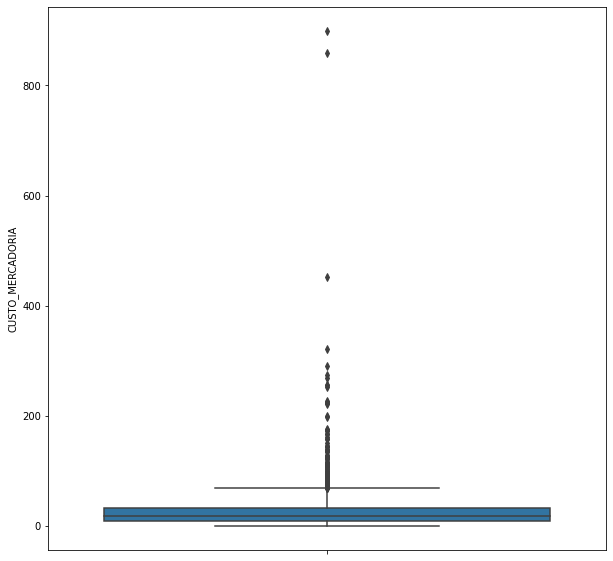

In [49]:
# Visualizando graficamente - Matplotlib

plt.figure(figsize=(10,10))
sns.boxplot(data=df1_vaistore_produtos, y='CUSTO_MERCADORIA')
_ = plt.show()

Analisando DF: `df1_vaistore_pedidos`

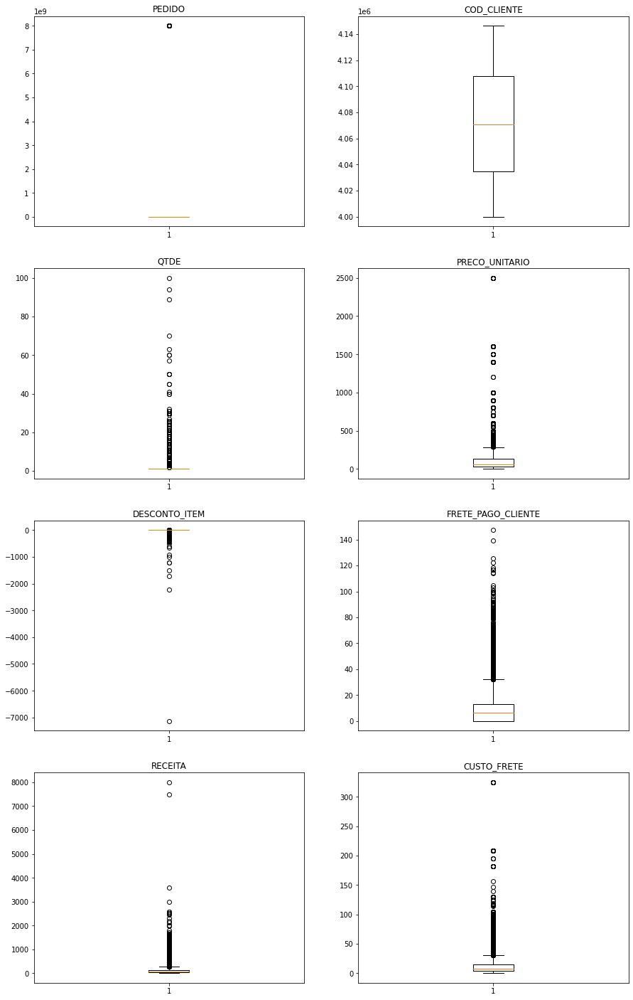

<Figure size 432x288 with 0 Axes>

In [28]:
# Plotando BoxPlot das features quantitativas do DF df1_vaistore_pedidos

fig, axs = plt.subplots(4,2,figsize=(15,25))

axs[0,0].set_title('PEDIDO')
axs[0,0].boxplot(df1_vaistore_pedidos.PEDIDO)

axs[0,1].set_title('COD_CLIENTE')
axs[0,1].boxplot(df1_vaistore_pedidos.COD_CLIENTE)

axs[1,0].set_title('QTDE')
axs[1,0].boxplot(df1_vaistore_pedidos.QTDE)

axs[1,1].set_title('PRECO_UNITARIO')
axs[1,1].boxplot(df1_vaistore_pedidos.PRECO_UNITARIO)

axs[2,0].set_title('DESCONTO_ITEM')
axs[2,0].boxplot(df1_vaistore_pedidos.DESCONTO_ITEM)

axs[2,1].set_title('FRETE_PAGO_CLIENTE')
axs[2,1].boxplot(df1_vaistore_pedidos.FRETE_PAGO_CLIENTE)

axs[3,0].set_title('RECEITA')
axs[3,0].boxplot(df1_vaistore_pedidos.RECEITA)

axs[3,1].set_title('CUSTO_FRETE')
axs[3,1].boxplot(df1_vaistore_pedidos.CUSTO_FRETE)

_ = plt.figure() # Estamso usando o matplotlib por questão de performance

Analisando DF: `df1_origem_traf`

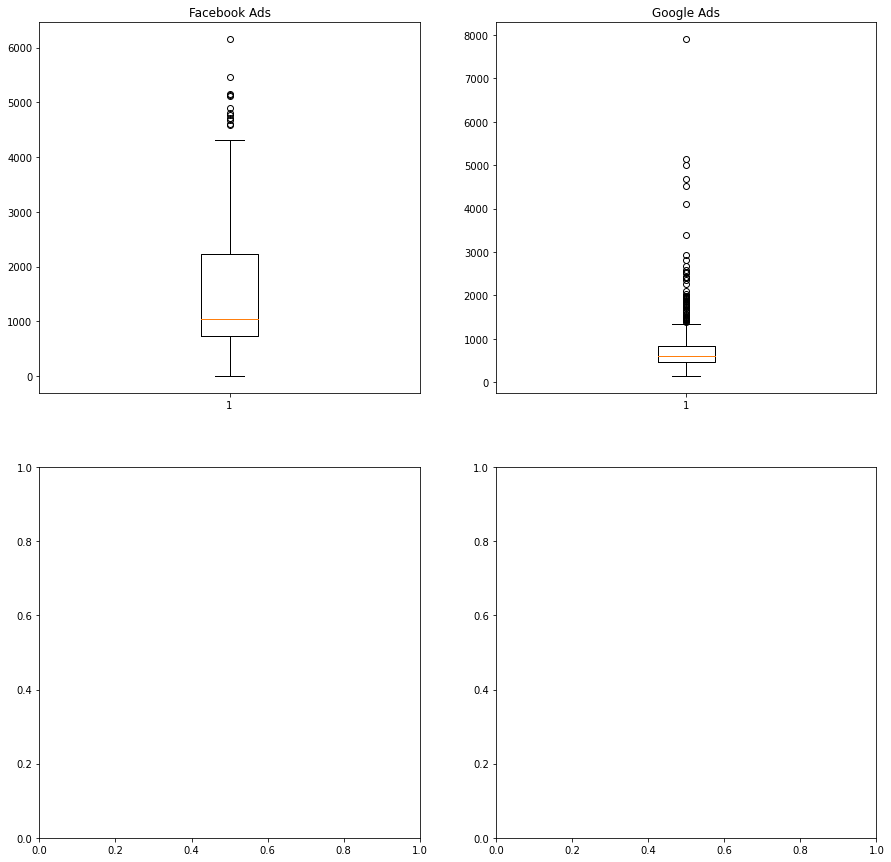

<Figure size 432x288 with 0 Axes>

In [30]:
# Plotando BoxPlot das features quantitativas do DF df_gasto_midia

fig, axs = plt.subplots(2,2,figsize=(15,15))

axs[0,0].set_title('Facebook Ads')
axs[0,0].boxplot(df_gasto_midia['Facebook Ads'])

axs[0,1].set_title('Google Ads')
axs[0,1].boxplot(df_gasto_midia['Google Ads'])



_ = plt.figure() # Estamos usando o matplotlib por questão de performance

Analisando DF: `df_cadastro_clientes`

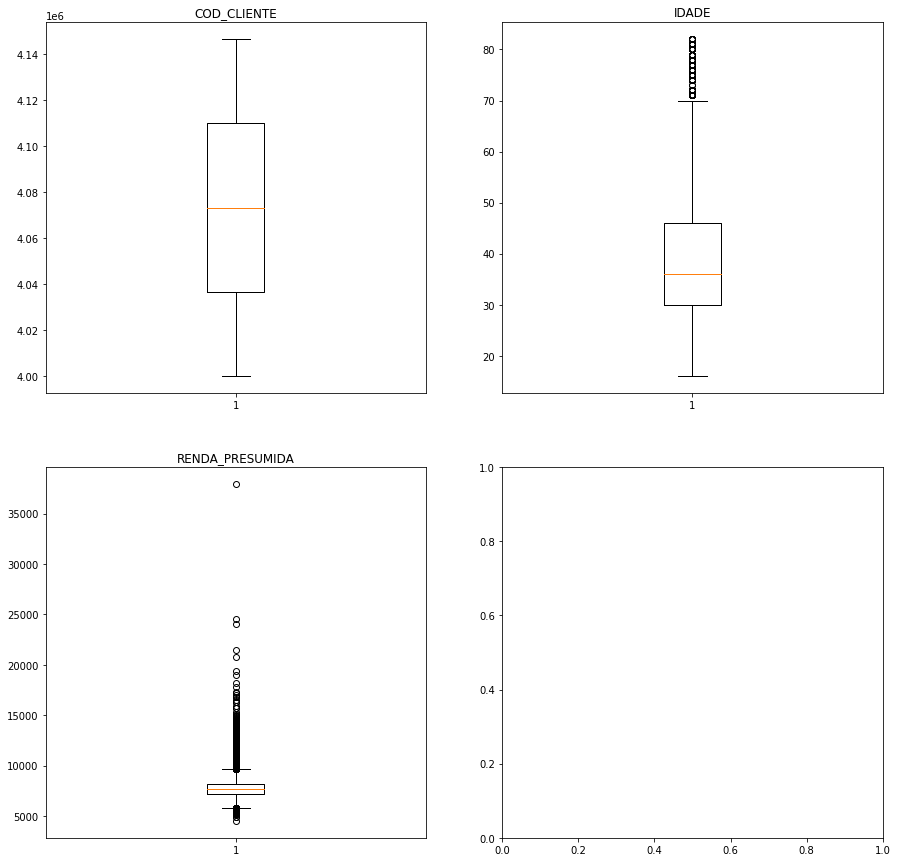

<Figure size 432x288 with 0 Axes>

In [31]:
# Plotando BoxPlot das features quantitativas do DF df_cadastro_clientes

fig, axs = plt.subplots(2,2,figsize=(15,15))

axs[0,0].set_title('COD_CLIENTE')
axs[0,0].boxplot(df_cadastro_clientes['COD_CLIENTE'])

axs[0,1].set_title('IDADE')
axs[0,1].boxplot(df_cadastro_clientes['IDADE'])

axs[1,0].set_title('RENDA_PRESUMIDA')
axs[1,0].boxplot(df_cadastro_clientes['RENDA_PRESUMIDA'])



_ = plt.figure() # Estamso usando o matplotlib por questão de performance

Até aqui, como nós já suspeitávamos, muitas variáveis possuem um grande número de valores discrepantes. Agora, nos resta avaliar a quantidade desses outliers em cada feature, bem como a porcentagem que elas representam. Para isso, iremos utilizar a função abaixo:

In [32]:
# Criando a função get_outliers_from_df_quanti

def get_outliers_and_info_from_df(df_inicial):
    
    """"Função que fornece um DataFrame com informações de estatística 
    descritiva e informações sobre outliers de CADA FEATURE INDIVIDUAL, 
    fornecido um DATAFRAME com FEATURES DE QUALQUER TIPO.
    
    Input: DataFrame
    Output: DataFrame"""
    
    # Criando listas que serão utilizadas para criar o df_resultante
    
    Features_list, IIQ_list, Limite_inferior_list = [],[],[]
    Limite_superior_list, Outliers_list, Porcentagem_list = [],[],[]
    colunas = []
    
    # Selecionando colunas numéricas do df fornecido
    

    for i,j in enumerate(df_inicial.columns):

        if df_inicial[j].dtypes == 'float64' or df_inicial[j].dtypes == 'int64':

            colunas.append(df_inicial.columns[i])
        else:

            pass     
    
    # Criando um DF de features quantitativas
    
    df = df_inicial[colunas]


    for feature in colunas:

        # Calculando primeiro quartil Q1

        Q1 = df[feature].quantile(0.25)

        # Calculando terceiro quartil Q3

        Q3 = df[feature].quantile(0.75)

        # Calculando intervalo inter quartil IIQ

        IIQ = Q3 - Q1

        # Range de tolerância

        tolerance = 1.5 * IIQ

        # Calculado limite inferior e superior

        lim_inf = Q1 - tolerance        
        min_value = df[feature].min()
        lim_inf = max(lim_inf, min_value)

        lim_sup = Q3 + tolerance
        max_value = df[feature].max()
        lim_sup = min(lim_sup, max_value)
        

        # Criando lista com valores outliers
    
        outliers = []

        for i in df.index:

            if ((df[feature][i] > lim_sup) == True):

                outliers.append(df[feature][i])

            elif ((df[feature][i] < lim_inf) == True):

                outliers.append(df[feature][i])

            else:

                pass

        # Calculando o total de outliers

        total_outliers = 0
        total_outliers = len(outliers)

        # Calculando a porcetagem de outliers

        porcent = (total_outliers/len(df.index)) * 100

        # Guardando resultados encontrados em listas
         
        Features_list.append(feature)
        IIQ_list.append(IIQ)
        Limite_inferior_list.append(lim_inf)
        Limite_superior_list.append(lim_sup)
        Outliers_list.append(total_outliers)
        Porcentagem_list.append(porcent)
      
    # Criando o DF resultante
    
    dicionario = {'Feature': Features_list, 
                  'IIQ': IIQ_list,
                  'Limite_inferior': Limite_inferior_list,
                  'Limite_superior': Limite_superior_list,
                  'Outliers': Outliers_list,
                  'Porcentagem_(%)': Porcentagem_list}

    df_resultante = pd.DataFrame(dicionario)
    
    # Retornando df_resultante
    
    return df_resultante

In [33]:
# Obtendo informações sobre outliers nas features quantitativas do DF df1_vaistore_produtos

df1_vaistore_produtos_info_outliers = get_outliers_and_info_from_df(df1_vaistore_produtos)

# Obtendo informações sobre outliers nas features quantitativas do DF df1_vaistore_pedidos

df1_vaistore_pedidos_info_outliers = get_outliers_and_info_from_df(df1_vaistore_pedidos)

# Obtendo informações sobre outliers nas features quantitativas do DF df_gasto_midia

df_gasto_midia_info_outliers = get_outliers_and_info_from_df(df_gasto_midia)

# Obtendo informações sobre outliers nas features quantitativas do DF df_cadastro_clientes

df_cadastro_clientes_info_outliers = get_outliers_and_info_from_df(df_cadastro_clientes)



display(df1_vaistore_produtos_info_outliers)

display(df1_vaistore_pedidos_info_outliers)

display(df_gasto_midia_info_outliers)

display(df_cadastro_clientes_info_outliers)

,Feature,IIQ,Limite_inferior,Limite_superior,Outliers,Porcentagem_(%)
0,CUSTO_MERCADORIA,24.17,0.52,68.965,114,6.781678


,Feature,IIQ,Limite_inferior,Limite_superior,Outliers,Porcentagem_(%)
0,PEDIDO,83757.00,7000001.00,7254392.500,43,0.014481
1,COD_CLIENTE,73030.00,4000001.00,4146333.000,0,0.000000
2,QTDE,0.00,1.00,1.000,17041,5.738928
3,PRECO_UNITARIO,100.00,1.00,279.900,8662,2.917117
4,DESCONTO_ITEM,0.00,0.00,0.000,63368,21.340554
5,FRETE_PAGO_CLIENTE,12.90,0.00,32.250,2732,0.920060
6,RECEITA,104.51,1.08,294.175,9700,3.266686
7,CUSTO_FRETE,10.50,0.00,30.330,10353,3.486598


,Feature,IIQ,Limite_inferior,Limite_superior,Outliers,Porcentagem_(%)
0,Facebook Ads,1503.5000,0.00,4488.41250,12,2.631579
1,Google Ads,369.3725,140.83,1379.50375,57,12.500000


,Feature,IIQ,Limite_inferior,Limite_superior,Outliers,Porcentagem_(%)
0,COD_CLIENTE,73166.00,4000001.00,4146333.00,0,0.000000
1,IDADE,16.00,16.00,70.00,363,0.248064
2,RENDA_PRESUMIDA,965.44,5760.68,9622.44,2394,1.635995


Com esse resultado em mãos, constatamos que apenas a feature `DESCONTO_ITEM` do DF `df1_vaistore_pedidos` apresenta uma porcentagem relevante de outliers. Por esse motivo, iremos analisa-la com mais detalhes.

Com excessão da feature `CUSTO_MERCADORIA` do DF `df1_vaistore_produtos` que apresenta um dos maiores outliers, porém nada extremamente alarmante, todas as demais features do demais DF's possuem menos de 5% de outliers.

Portanto, nosso plano de ação será:

* Analisar e tratar os outliers das features `DESCONTO_ITEM` (DF: `df1_vaistore_pedidos`);
* Analisar e tratar os outliers das features `CUSTO_MERCADORIA` (DF: `df1_vaistore_produtos`);
* Analisar e tratar os outliers das features `Google Ads` (DF: `df_gasto_midia_info_outliers`);
* Analisar e tratar os outliers das features `QTDE` (DF: `df1_vaistore_pedidos`);
* Analisar e tratar os outliers das features `RENDA_PRESUMIDA` (DF: `df_cadastro_clientes`);
* Não modificar os demais registros, pois considerando que temos poucos outliers, mas que o número de observações deles em relação a base que eles pertecem podem ser distintas, corremos o risco de dropar esses registros e acabar eliminando muitas linhas de nosso dataset, sendo assim, vamos mantê-los.

Primeiramente, iremos definir uma função que nos retorna um array com os valores identificados como outliers:

In [34]:
# Criando a função get_outliers_from_df_quanti

def get_outliers_from_df_and_feature(df_quanti, feature):

    """Função que fornece todos os outliers de uma feature.

     Input: df_quanti, feature (string).
     Output: Array com todos os outliers da feature fornecida.

     OBS: df_quanti -> Representa um DF que possuem apenas features quantitativas"""

    import numpy as np

    # Calculando primeiro quartil Q1

    Q1 = df_quanti[feature].quantile(0.25)

    # Calculando terceiro quartil Q3

    Q3 = df_quanti[feature].quantile(0.75)

    # Calculando intervalo inter quartil IIQ

    IIQ = Q3 - Q1

    # Range de tolerância

    tolerance = 1.5 * IIQ

    # Calculado limite inferior e superior

    lim_inf = Q1 - tolerance        
    min_value = df_quanti[feature].min()
    lim_inf = max(lim_inf, min_value)

    lim_sup = Q3 + tolerance
    max_value = df_quanti[feature].max()
    lim_sup = min(lim_sup, max_value)


    # Criando lista com valores outliers

    outliers = []

    for i in df_quanti.index:

        if ((df_quanti[feature][i] > lim_sup) == True):

              outliers.append(df_quanti[feature][i])

        elif ((df_quanti[feature][i] < lim_inf) == True):

            outliers.append(df_quanti[feature][i])

        else:

            pass

    # Calculando o total de ouliers

    total_outliers = 0
    total_outliers = len(outliers)

    # Calculando a porcetagem de outliers

    porcent = (total_outliers/len(df_quanti.index)) * 100
    porcent = round(porcent, 2)

    # Output da função

    if len(outliers) == 0:
        print(f"A feature '{feature}' não possui outliers.")
    else:
        return np.array(outliers)

* Análisando a feature `DESCONTO_ITEM`:

In [35]:
# Aplicando a função get_outliers_from_df_and_feature a DESCONTO_ITEM


outiliers_DESCONTO_ITEM = get_outliers_from_df_and_feature(df1_vaistore_pedidos[df1_vaistore_pedidos.describe().columns], 'DESCONTO_ITEM')

# Visualizando o array

print(outiliers_DESCONTO_ITEM)

[-12.99  -1.17 -14.99 ...  -4.94  -5.98  -5.98]


In [36]:
# Verificando se o nº de outiliers detectados coincide com o detecatado pela outra função

print(f'Nº de outliers em DESCONTO_ITEM: {len(outiliers_DESCONTO_ITEM)}')

Nº de outliers em DESCONTO_ITEM: 63368


In [37]:
# Visualizando dados de DESCONTO_ITEM

df1_vaistore_pedidos[['DESCONTO_ITEM']].describe()

,DESCONTO_ITEM
count,296937.000000
mean,-3.324094
std,20.479760
min,-7135.200000
25%,0.000000
50%,0.000000
75%,0.000000
max,0.000000


In [38]:
# Visualizando graficiamente - Plotly

#df1_vaistore_pedidos['DESCONTO_ITEM'].plot(kind='box')

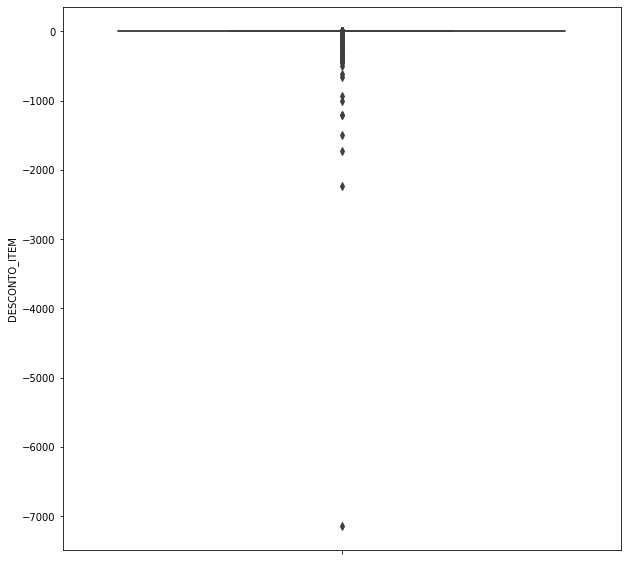

In [39]:
# Visualizando graficiamente - Matplotlib

plt.figure(figsize=(10,10))
sns.boxplot(data=df1_vaistore_pedidos, y='DESCONTO_ITEM')
_ = plt.show()

Como podemos verificar, temos um número considerável de outliers, o que indica que esses valores não são mais um padrão qualquer e sim algo relativamente frequente, poderíamos dizer que a cada 10 descontos fornecidos pelo ecommerce, 2 estariam entre valores. Pensando assim, temos motivos para deixar os valores detectados como outliers na feature. Com excessão do único valor abaixo de -7000, esse sim representando um outlier. O registro que corresponde a esse valor de desconto é:

In [40]:
# Visualizando registro em que DESCONTO_ITEM => 7000

df1_vaistore_pedidos[df1_vaistore_pedidos.DESCONTO_ITEM < -7000]

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
242326,2020-10-22,7105490,P10000228017,4113368,E10539Y,60,139.9,-7135.2,0.0,1258.8,18.19


In [50]:
# Verificando a média de DESCONTO_ITEM para PRODUTO = E10539Y

df1_vaistore_pedidos[df1_vaistore_pedidos.PRODUTO == 'E10539Y'][['DESCONTO_ITEM']].mean()

DESCONTO_ITEM   -28.365977
dtype: float64

In [51]:
# Verificando a mediana de RECEITA para PRODUTO = E10539Y

df1_vaistore_pedidos[df1_vaistore_pedidos.PRODUTO == 'E10539Y'][['RECEITA']].median()

RECEITA    132.8
dtype: float64

In [52]:
df1_vaistore_pedidos[df1_vaistore_pedidos.DESCONTO_ITEM < -7000]['DESCONTO_ITEM'].count()

1

In [53]:
# Verificando a probabilidade de DESCONTO_ITEM > 7000 ocorrer

prob_outliers = df1_vaistore_pedidos[df1_vaistore_pedidos.DESCONTO_ITEM < -7000]['DESCONTO_ITEM'].count() / df1_vaistore_pedidos['DESCONTO_ITEM'].count()

# Convertendo para porcentagem

prob_outliers = round(prob_outliers*100, 5)

# Visualizando

print(f'Proporção de DESCONTO_ITEM > 7000 em nossa base: {prob_outliers}%')

Proporção de DESCONTO_ITEM > 7000 em nossa base: 0.00034%


Avaliando mais detalhadamento o registro, notamos que o dado na feature DATA_VENDA não representa nenhuma data especial. Entretanto, notamos que o valor de QTDE justifica o preço (indicando que quantidade de pedidos foi extremamente alta). Além disso, notamos ainda que a receita foi relativamente condizente com o valor do desconto.

Tais informações indicam que esse registro não foi um erro humano e não há nada que indique a impossibilidade dele. Contudo, há fortes indícios de sua possibilidade. Por esse motivo, vamos exclui-lo de nossa análise.

In [54]:
# Eliminando o registro DESCONTO_ITEM = - 7135.2

df1_vaistore_pedidos = df1_vaistore_pedidos[~(df1_vaistore_pedidos.DESCONTO_ITEM == -7135.2)]

# Visualizando

df1_vaistore_pedidos[['DESCONTO_ITEM']]

,DESCONTO_ITEM
0,0.00
1,0.00
2,-12.99
3,0.00
4,-1.17
...,...
296932,0.00
296933,0.00
296934,0.00
296935,0.00


In [55]:
# Visualizando medidas de tendência central após tratamento de outliers

df1_vaistore_pedidos[['DESCONTO_ITEM']].describe()

,DESCONTO_ITEM
count,296936.000000
mean,-3.300076
std,15.752010
min,-2230.500000
25%,0.000000
50%,0.000000
75%,0.000000
max,0.000000


-------------------------------------------
---------------

In [56]:
# Calculando o percentual de desconto

df1_vaistore_pedidos_TESTE = df1_vaistore_pedidos.copy()

df1_vaistore_pedidos_TESTE['PORCENT_DESCONTO'] = (df1_vaistore_pedidos_TESTE.DESCONTO_ITEM 
                                                  / df1_vaistore_pedidos_TESTE.PRECO_UNITARIO)*(-1)

df1_vaistore_pedidos_TESTE['PORCENT_DESCONTO'].describe()

count    296936.000000
mean          0.042183
std           0.155173
min          -0.000000
25%          -0.000000
50%          -0.000000
75%           0.000000
max          13.949343
Name: PORCENT_DESCONTO, dtype: float64

In [57]:
# Verificando registros com porcentagem maior que 1

df1_vaistore_pedidos_TESTE[df1_vaistore_pedidos_TESTE.PORCENT_DESCONTO > 1]

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,PORCENT_DESCONTO
2545,2020-01-31,7004822,P10000127790,4143921,E10269Y,2,269.9,-407.00,0.00,132.80,35.09,1.507966
2733,2020-02-02,7005077,P10000128040,4137363,E10269Y,2,269.9,-441.94,0.00,97.86,35.09,1.637421
3062,2020-02-05,7005645,P10000128587,4036351,E10269Y,2,269.9,-413.98,0.00,125.82,35.09,1.533827
5274,2020-02-20,7008161,P10000131030,4145628,E10247Y,14,39.9,-55.86,0.00,502.74,5.19,1.400000
6874,2020-03-03,7009541,P10000294719,4014457,E10164Y,6,19.9,-59.89,4.22,84.83,4.22,3.009548
...,...,...,...,...,...,...,...,...,...,...,...,...
287383,2020-12-28,7153919,P10000276262,4113368,E10729Y,3,169.9,-427.14,0.00,82.56,22.09,2.514067
287384,2020-12-28,7153919,P10000276262,4113368,E10736Y,3,129.9,-326.58,0.00,63.12,16.89,2.514088
287385,2020-12-28,7153919,P10000276262,4113368,E10819Y,3,79.9,-200.88,0.00,38.82,10.39,2.514143
287386,2020-12-28,7153919,P10000276262,4113368,E10824Y,3,29.9,-75.18,0.00,14.52,3.89,2.514381


In [61]:
# Total de registros do DF

len(df1_vaistore_pedidos_TESTE.index)

296843

In [62]:
# Excluindo registros com PORCENT_DESCONTO > 100

df1_vaistore_pedidos_TESTE = df1_vaistore_pedidos_TESTE[~(df1_vaistore_pedidos_TESTE.PORCENT_DESCONTO > 1)]

# Visualizando resultado

df1_vaistore_pedidos_TESTE

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,PORCENT_DESCONTO
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,-0.000000
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,-0.000000
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,0.100000
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,-0.000000
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,0.006161
...,...,...,...,...,...,...,...,...,...,...,...,...
296932,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,-0.000000
296933,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,-0.000000
296934,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,-0.000000
296935,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,-0.000000


------------------------------
------------------------------


* Analisando a feature `CUSTO_MERCADORIA`:

In [63]:
# Aplicando a função get_outliers_from_df_and_feature a CUSTO_MERCADORIA


outiliers_CUSTO_MERCADORIA = get_outliers_from_df_and_feature(df1_vaistore_produtos[df1_vaistore_produtos.describe().columns], 'CUSTO_MERCADORIA')

# Visualizando o array

print(np.sort(outiliers_CUSTO_MERCADORIA))

[ 68.97  69.27  69.29  69.43  69.44  71.51  71.66  71.69  71.81  72.31
  72.45  73.48  73.54  73.83  74.09  74.45  74.54  74.7   74.72  75.01
  75.24  75.83  76.41  76.47  77.73  78.85  79.82  80.12  80.77  81.27
  81.44  81.46  81.52  81.66  81.87  81.88  82.66  83.29  83.33  84.02
  84.85  85.31  85.51  86.13  86.47  87.05  87.18  87.18  88.65  90.05
  90.18  92.21  92.49  93.41  94.48  96.33  98.5   99.66 100.46 103.58
 104.01 106.2  107.86 108.05 108.07 108.38 108.65 109.46 109.78 110.47
 113.04 114.09 116.55 116.91 121.6  121.84 122.92 124.49 125.81 127.83
 129.49 133.59 136.37 138.   139.91 143.43 144.42 144.59 150.72 157.93
 158.11 161.12 167.46 167.64 172.84 173.83 174.22 176.45 197.53 200.38
 221.22 222.34 225.63 226.86 253.05 255.38 256.31 268.19 273.74 290.07
 321.22 451.89 858.13 898.22]


In [64]:
# Verificando se o nº de outiliers detectador coincide com o detecatado pela outra função

print(f'Nº de outliers em CUSTO_MERCADORIA: {len(outiliers_CUSTO_MERCADORIA)}')

Nº de outliers em CUSTO_MERCADORIA: 114


In [65]:
# Visualizando dados de DESCONTO_ITEM

df1_vaistore_produtos[['CUSTO_MERCADORIA']].describe()

,CUSTO_MERCADORIA
count,1681.000000
mean,27.787252
std,44.747764
min,0.520000
25%,8.540000
50%,17.200000
75%,32.710000
max,898.220000


In [ ]:
# Visualizando graficiamente - Plotly

#df1_vaistore_produtos['CUSTO_MERCADORIA'].plot(kind='box')

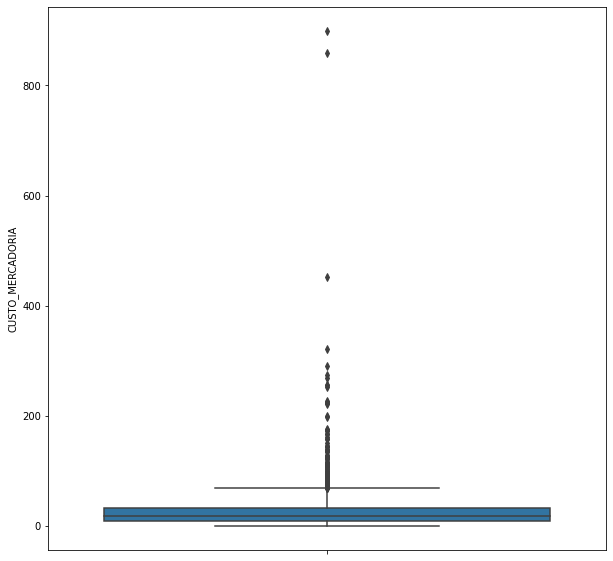

In [66]:
# Visualizando graficiamente - Matplotlib

plt.figure(figsize=(10,10))
sns.boxplot(data=df1_vaistore_produtos, y='CUSTO_MERCADORIA')
_ = plt.show()

Inicialmente, utilizandoa função `get_outliers_ouoliers_and_info_from_df()`, identificamos que essa feature possui 6% de outliers. Olhando melhor para seu box plot, notamos que existem, dentre os outliers, 3 registros destacam-se: `CUSTO_MERCADORIA` = 451.89, 858.13 e 898.22. Para avaliar a relevância de todos os outliers, vamos calcular a probabilidade de valores maiores que o primeiro outliers acontecer e que valores maiores que 450.0 ocorrerem:

In [67]:
# Verificando a probabilidade de CUSTO_MERCADORIA > 450 ocorrer

prob2_outliers = df1_vaistore_produtos[df1_vaistore_produtos.CUSTO_MERCADORIA > 450]['CUSTO_MERCADORIA'].count() / df1_vaistore_produtos['CUSTO_MERCADORIA'].count()

# Convertendo para porcentagem

prob2_outliers = round(prob2_outliers*100, 5)

# Visualizando

print(f'Proporção de CUSTO_MERCADORIA > 450 em nossa base: {prob2_outliers}%')

Proporção de CUSTO_MERCADORIA > 450 em nossa base: 0.17847%


In [68]:
# Visualizando registro em que CUSTO_MERCADORIA > 450

df1_vaistore_produtos[df1_vaistore_produtos.CUSTO_MERCADORIA > 450]

,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
1269,E10542Y,858.13,TECH
1288,E10561Y,898.22,TECH
1396,E10669Y,451.89,ACESSORIOS


Não notamos nada que indique um possível erro de registro ou um registro fisicamente impossível de ocorrer, considerando os critérios em análise. Entretanto, considerando que a proporção de registros com CUSTO_MERCADORIA > 450 é menor que 0.2% em nossa base, vamos optar por apaga-los. Já quanto aos demais outliers, vamos mantê-los, considerando-os como dados relevantes para as análises posteriores. Sendo assim:

In [69]:
# Excluindo registros com CUSTO_MERCADORIA > 450

df1_vaistore_produtos = df1_vaistore_produtos[~(df1_vaistore_produtos.CUSTO_MERCADORIA > 450)]

# Visualizando

df1_vaistore_produtos

,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
0,A10001G,21.10,BASICO
1,A10002M,21.10,BASICO
2,A10003M,22.60,BASICO
3,A10004P,22.60,BASICO
4,A10005M,22.60,BASICO
...,...,...,...
1676,G10006,44.75,ACESSORIOS
1677,G10007,51.55,ACESSORIOS
1678,G10008,44.01,ACESSORIOS
1679,G10009,46.46,ACESSORIOS


* Analisando a feature `Google Ads`:

In [70]:
# Aplicando a função get_outliers_from_df_and_feature a Google Ads


outiliers_CUSTO_MERCADORIA = get_outliers_from_df_and_feature(df_gasto_midia[df_gasto_midia.describe().columns], 'Google Ads')

# Visualizando o array

print(np.sort(outiliers_CUSTO_MERCADORIA))

[1383.44 1418.27 1430.8  1432.34 1450.61 1457.6  1460.03 1471.74 1476.87
 1504.37 1507.45 1559.57 1573.97 1622.12 1650.08 1658.41 1710.71 1733.82
 1759.63 1772.4  1784.63 1794.46 1794.77 1824.76 1876.52 1879.66 1920.81
 1938.43 1945.71 1951.31 1956.06 1957.8  1967.35 1975.39 1978.96 1980.21
 2043.6  2108.81 2274.47 2344.58 2410.46 2425.17 2428.61 2522.11 2540.03
 2541.4  2590.36 2666.71 2815.89 2923.43 3399.99 4106.76 4521.29 4670.13
 5008.41 5149.55 7899.19]


In [ ]:
# Visualizando graficiamente - Plotly

#df_gasto_midia['Google Ads'].plot(kind='box')

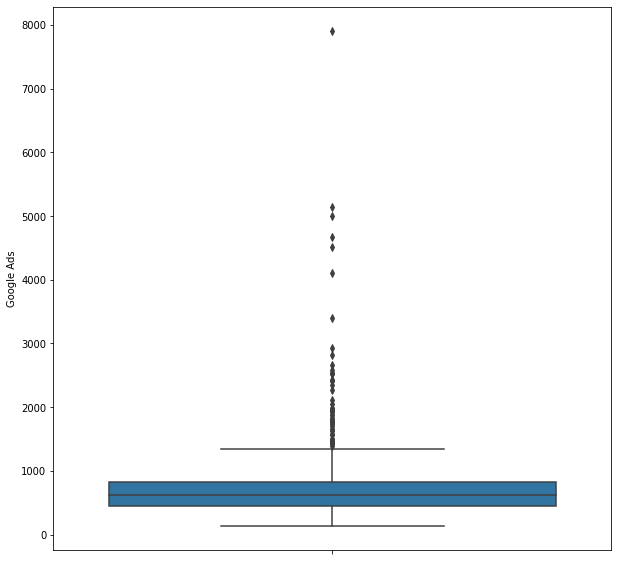

In [71]:
# Visualizando graficiamente - Matplotlib

plt.figure(figsize=(10,10))
sns.boxplot(data=df_gasto_midia, y='Google Ads')
_ = plt.show()

Dentre os outliers, os registros com valores `Google Ads` => 3300.0 chamam nossa atenção. Vamos olhar com mais detalhe para ele e verificar quem são esses registros:

In [72]:
# Verificando registro com Google Ads => 3300.0

df_gasto_midia[df_gasto_midia['Google Ads'] > 3300]

,Dia,Facebook Ads,Google Ads
150,2020-05-30,0.00,4106.76
151,2020-05-31,0.00,5008.41
327,2020-11-23,2066.63,3399.99
330,2020-11-26,3912.44,4521.29
331,2020-11-27,6151.03,7899.19
332,2020-11-28,3766.13,4670.13
333,2020-11-29,3994.37,5149.55


Tendo em vista as informações da feature `Dia`, notamos que a maioria desses valores ocorre no final do mês de novembro, onde o maior valor de `Google Ads` ocorre no dia 27/11 (BlackFriday). Por esse motivo, considerando que esses dados apresentam-se como dados relevantes para as análises posteriores, vamos optar por deixa-los em nossa base.

#### Análise multivariada:

In [73]:
# Visualizando os Df's após os tratamentos feitos

print('df1_vaistore_produtos:')
display(df1_vaistore_produtos.isnull().sum())
print('')
print('df1_vaistore_pedidos:')
display(df1_vaistore_pedidos.isnull().sum()) 
print('')
print('df1_origem_traf:')
display(df1_origem_traf.isnull().sum())
print('')
print('df_gasto_midia:')
display(df_gasto_midia.isnull().sum())
print('')
print('df_cadastro_clientes:')
display(df_cadastro_clientes.isnull().sum())

df1_vaistore_produtos:


PRODUTO             0
CUSTO_MERCADORIA    0
LINHA_PRODUTO       0
dtype: int64


df1_vaistore_pedidos:


DATA_VENDA            0
PEDIDO                0
PEDIDO_ERP            0
COD_CLIENTE           0
PRODUTO               0
QTDE                  0
PRECO_UNITARIO        0
DESCONTO_ITEM         0
FRETE_PAGO_CLIENTE    0
RECEITA               0
CUSTO_FRETE           0
dtype: int64


df1_origem_traf:


PEDIDO_ERP             0
CANAL_MARKETING    20431
dtype: int64


df_gasto_midia:


Dia             0
Facebook Ads    0
Google Ads      0
dtype: int64


df_cadastro_clientes:


COD_CLIENTE        0
IDADE              0
UF                 0
REGIAO             0
RENDA_PRESUMIDA    0
dtype: int64

A fim de fazer uma análise multivariada mais completa, vamos criar um DF df_all que será um merge entre todos os outros DF com suas features (com exceção do DF df_gasto_midia):

In [74]:
# Merge entre df1_vaistore_pedidos e df1_vaistore_produtos

df_all = pd.merge(df1_vaistore_pedidos, df1_vaistore_produtos, how='left', on='PRODUTO')

# Merge entre df_all e df1_origem_traf

df_all = pd.merge(df_all, df1_origem_traf, how='left', on='PEDIDO_ERP')

# Merge entre df_all e df_cadastro_clientes

df_all = pd.merge(df_all, df_cadastro_clientes, how='left', on='COD_CLIENTE')

# Visualizando

df_all

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,45.10,ACESSORIOS,Google Ads,49.0,MT,Centro-Oeste,7898.90
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,43.13,BOLSAS,Facebook Ads,34.0,CE,Nordeste,7662.37
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,21.97,FASHION,Busca orgânica,33.0,SP,Sudeste,7881.38
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,6.73,BASICO,Facebook Ads,37.0,RJ,Sudeste,6765.96
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,36.67,ACESSORIOS,NaN,49.0,PA,Norte,7586.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296931,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,7.76,BASICO,NaN,53.0,MG,Sudeste,7114.90
296932,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,12.38,FASHION,NaN,35.0,PE,Nordeste,8400.16
296933,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,36.67,ACESSORIOS,NaN,41.0,RN,Nordeste,8306.05
296934,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,8.88,BASICO,NaN,31.0,MA,Nordeste,8068.73


In [75]:
# Verificando se existem dados nulos após o merge

df_all.isnull().sum()

DATA_VENDA                0
PEDIDO                    0
PEDIDO_ERP                0
COD_CLIENTE               0
PRODUTO                   0
QTDE                      0
PRECO_UNITARIO            0
DESCONTO_ITEM             0
FRETE_PAGO_CLIENTE        0
RECEITA                   0
CUSTO_FRETE               0
CUSTO_MERCADORIA         14
LINHA_PRODUTO            14
CANAL_MARKETING       41253
IDADE                     0
UF                        0
REGIAO                    0
RENDA_PRESUMIDA           0
dtype: int64

In [76]:
# Visualizando os registros que apresentam dados nulos

df_all[pd.isnull(df_all.CUSTO_MERCADORIA)]

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
1525,2020-01-21,7002985,P10000126043,4018259,E10561Y,1,2499.9,0.00,0.00,2499.90,324.99,NaN,NaN,Google Ads,49.0,PR,Sul,17035.45
5104,2020-01-10,7001185,P10000124297,4141974,E10561Y,1,2499.9,0.00,0.00,2499.90,324.99,NaN,NaN,Busca orgânica,27.0,RN,Nordeste,16763.96
6504,2020-01-18,7002446,P10000125522,4000944,E10561Y,1,2499.9,0.00,0.00,2499.90,324.99,NaN,NaN,Google Ads,36.0,BA,Nordeste,12480.98
13576,2020-01-17,7002232,P10000125308,4030206,E10542Y,3,2499.9,0.00,0.00,7499.70,324.99,NaN,NaN,Direto,37.0,MG,Sudeste,37943.11
15749,2020-02-22,7008404,P10000131269,4100808,E10561Y,1,2499.9,-315.00,0.00,2184.90,324.99,NaN,NaN,Google Ads,29.0,MG,Sudeste,16278.79
19508,2020-03-14,7010754,P10000133518,4060964,E10561Y,1,2499.9,-362.49,0.00,2137.41,324.99,NaN,NaN,Email,36.0,MA,Nordeste,10258.36
22938,2020-02-19,7007991,P10000130867,4015062,E10561Y,1,2499.9,0.00,0.00,2499.90,0.00,NaN,NaN,Google Ads,57.0,MT,Centro-Oeste,16522.99
189890,2020-11-27,7131319,P10000253808,4064782,E10669Y,1,999.9,0.00,0.00,999.90,0.00,NaN,NaN,NaN,32.0,SC,Sul,9093.25
217875,2020-11-27,7131640,P10000254069,4063993,E10669Y,1,999.9,0.00,0.00,999.90,129.99,NaN,NaN,NaN,23.0,CE,Nordeste,10792.55
218553,2020-11-27,7132185,P10000254602,4140562,E10669Y,1,999.9,0.00,14.21,1014.11,14.21,NaN,NaN,Google Ads,31.0,MA,Nordeste,11509.43


Considerando que que existem 14 registros com dados nulos em `CUSTO_MERCADORIA` e `LINHA_PRODUTO`, e que o total de registro em noss DF df_all é de 296936, vamos optar por exluir tais registros.

In [77]:
# Excluindo registros com dados nulos

df_all = df_all[~(pd.isnull(df_all.CUSTO_MERCADORIA))]

# Visualizando quantidade de dados nulos em df_all

df_all.isnull().sum()

DATA_VENDA                0
PEDIDO                    0
PEDIDO_ERP                0
COD_CLIENTE               0
PRODUTO                   0
QTDE                      0
PRECO_UNITARIO            0
DESCONTO_ITEM             0
FRETE_PAGO_CLIENTE        0
RECEITA                   0
CUSTO_FRETE               0
CUSTO_MERCADORIA          0
LINHA_PRODUTO             0
CANAL_MARKETING       41250
IDADE                     0
UF                        0
REGIAO                    0
RENDA_PRESUMIDA           0
dtype: int64

In [ ]:
# Criando df_all_quanti apenas com variáveis quantitativas

#df_all_quanti = df_all[df_all.describe().columns]

# Viualizando

#df_all_quanti

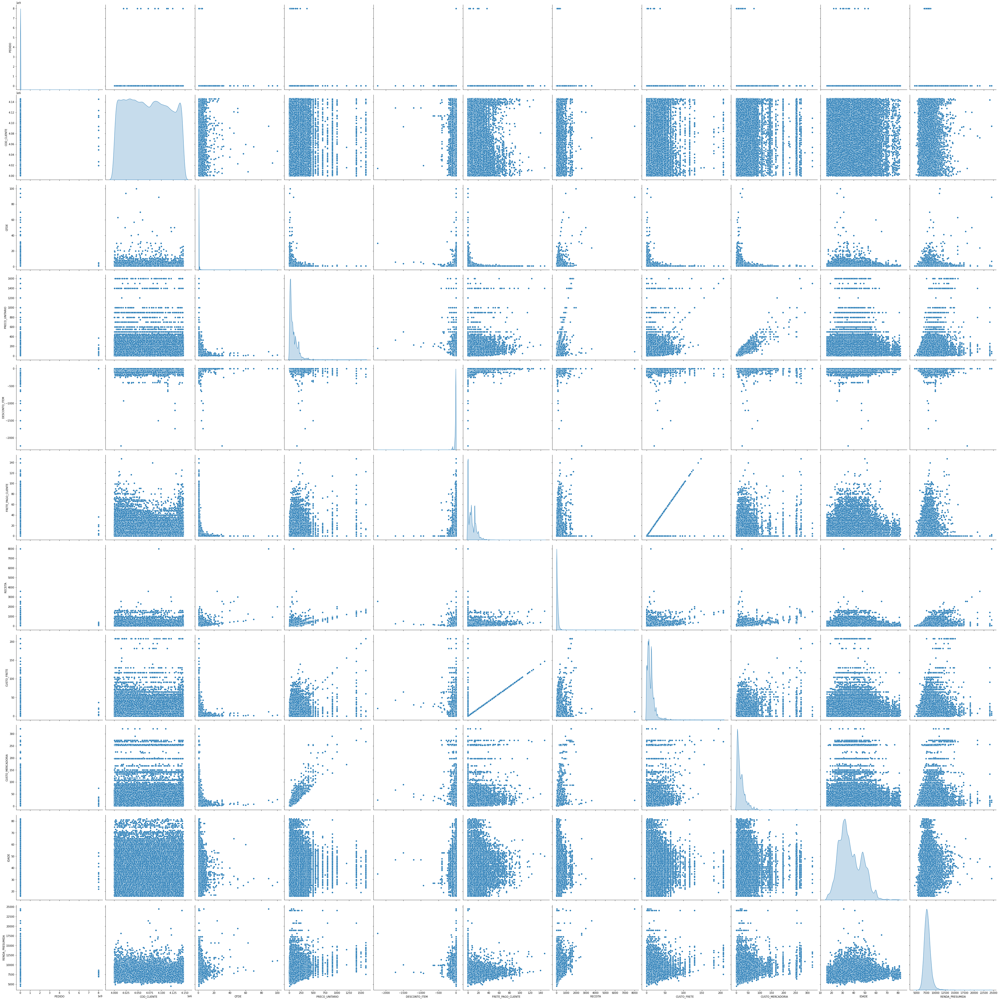

In [78]:
# Pairplot de df_all_quanti

_ = sns.pairplot(df_all, diag_kind="kde", height=5) # Dois cliques -> amplia a imagem

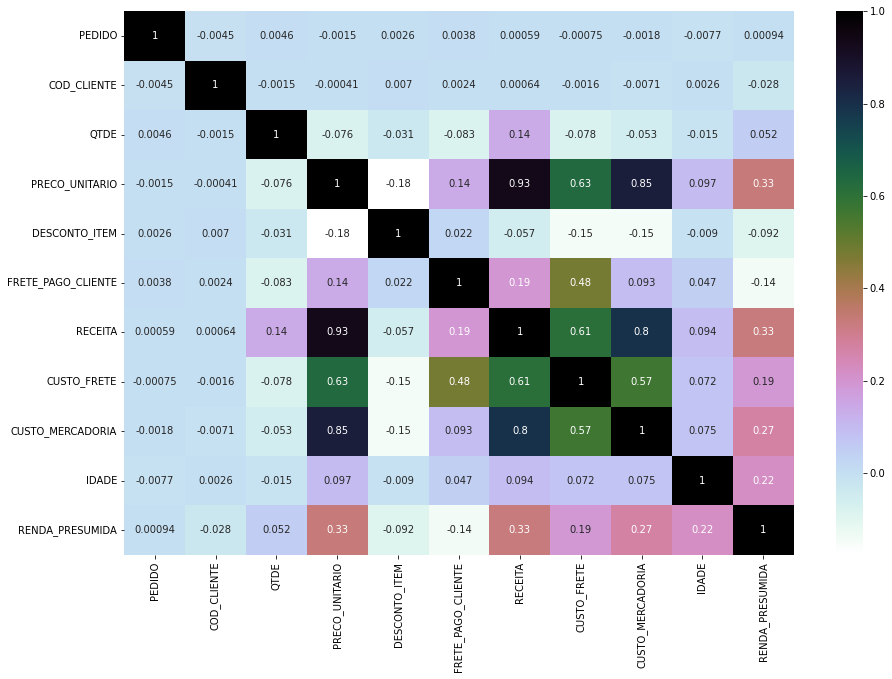

In [79]:
# Heat Map de df_all_quanti

plt.figure(figsize=(15,10)) 
sns.heatmap(df_all.corr(),annot=True, cmap='cubehelix_r')

plt.show()

Notamos que:

* `FRETE_PAGO_CLIENTE` e `CUSTO_FRETE` possuem correlação positiva máxima. O que era de se esperar, visto que analisando o dataset, verificamos que os clientes, na grande maioria das vezes, arcam com as despesas do frete;
* Notamos uma forte correção positiva entre `PRECO_UNITARIO` e `RECEITA`. Indicando que o preço de cada produto está intimamente ligado a receita da empresa (não necessariamente causa o aumento da receita, pois correlação não implica em causalidade).
* Identificamos uma correlação positiva considerável entre `RECEITA` e `CUSTO_MERCADORIA`, e entre `RECEITA` e `RENDA_PRESUMIDA`. 

Além disso:

* A feature `PEDIDO` apresenta um valor discrepante quando comparado a outras features, precisamente um valor aproximadamente igual a 8e+9, o qual merece ser analisada.
* A feature `QTDE` apresenta um valor discrepate quando comparado a outras features, precisamente um valor aproximadamente igual a 4, o qual merece ser analisada.

* Analisando `PEDIDO`:

In [80]:
# Verificando PEDIDO >= 8e+9

display(df_all[df_all.PEDIDO >= 8e+9].head())

# Quantidade de registros com PEDIDO >= 8e+9

print(f'Quantidade de registros: {df_all[df_all.PEDIDO >= 8e+9].PEDIDO.count()}')

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
241283,2020-08-17,8000000002,P10000211030,4026666,B10164,1,169.9,0.0,3.75,173.65,3.75,20.48,FASHION,Facebook Ads,24.0,AL,Nordeste,8109.26
241284,2020-08-17,8000000002,P10000211030,4026666,E10006Y,1,129.9,0.0,3.75,133.65,3.75,26.00,ACESSORIOS,Facebook Ads,24.0,AL,Nordeste,8109.26
241285,2020-08-17,8000000003,P10000211030,4026666,E10006Y,1,49.9,0.0,1.84,51.74,1.84,26.00,ACESSORIOS,Facebook Ads,24.0,AL,Nordeste,8109.26
241286,2020-08-17,8000000004,P10000211030,4026666,E10006Y,1,49.9,0.0,1.84,51.74,1.84,26.00,ACESSORIOS,Facebook Ads,24.0,AL,Nordeste,8109.26
241458,2020-12-10,8000000008,P10000294133,4093369,E10612Y,1,169.9,0.0,36.49,206.39,36.49,30.65,ACESSORIOS,NaN,50.0,SC,Sul,7809.62


Quantidade de registros: 43


In [81]:
# Verificando código dos pedidos em ordem decrescente

df_all.PEDIDO.sort_values(ascending=False)

262366    8000000021
262365    8000000020
242093    8000000020
242092    8000000020
241468    8000000019
             ...    
10448        7000004
1            7000003
3944         7000002
3945         7000002
0            7000001
Name: PEDIDO, Length: 296922, dtype: int64

Acredito que o código do pedido foi inserido incorretamente, considerando que esse é o único código que possui 10 dígitos. Entretando, tal característica não aparenta ter nenhum implicação para nossas análises futuras, visto que é apenas um registro para especificar um pedido. Portanto, não vamos realizar nenhuma mudaça.

* Analisando `QTDE`:

In [82]:
# Total de registro para df_all.QTDE

len(df_all.QTDE.index)

296922

In [83]:
# Verificando QTDE >= 4

df_all[df_all.QTDE >= 4]

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
278,2020-01-06,7000607,P10000294590,4001705,E10467Y,4,29.9,-1.26,5.27,141.94,5.27,4.66,FASHION,NaN,33.0,MG,Sudeste,6595.78
588,2020-01-10,7001227,P10000124339,4125975,B10138,5,24.9,0.00,4.20,145.50,4.20,7.52,FASHION,Busca orgânica,23.0,ES,Sudeste,7128.14
650,2020-01-11,7001332,P10000124440,4017797,B10038,4,9.9,-3.98,3.40,49.22,3.40,0.74,BASICO,Google Ads,49.0,BA,Nordeste,8302.54
778,2020-01-13,7001583,P10000124691,4062354,E10477Y,5,19.9,0.00,0.00,99.50,0.00,6.73,BASICO,Google Ads,36.0,SP,Sudeste,7462.40
790,2020-01-13,7001600,P10000124701,4080598,E10051Y,6,49.9,0.00,0.00,299.40,6.49,9.07,ACESSORIOS,Google Ads,41.0,MS,Centro-Oeste,8675.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295566,2021-02-27,7169295,P10000291478,4023921,B10113,5,9.9,-4.95,2.74,58.25,2.74,17.20,BASICO,Google Ads,29.0,SP,Sudeste,7469.94
295618,2021-02-28,7169393,P10000291577,4140406,B10012,24,7.9,0.00,0.81,209.04,0.81,2.05,BASICO,Busca orgânica,34.0,MG,Sudeste,7641.90
296105,2021-03-04,7170391,P10000292527,4068842,E10500Y,4,4.9,0.00,1.61,26.04,1.61,1.40,BASICO,NaN,36.0,PR,Sul,8097.54
296775,2021-03-09,7171723,P10000293834,4010502,B10196,8,9.9,0.00,1.72,92.96,1.72,1.85,BASICO,NaN,25.0,MG,Sudeste,7203.38


In [84]:
# Representação de QTDE >= 4 em df_all


len(df_all[df_all.QTDE >= 4]) / len(df_all.QTDE.index) * 100

0.6958056324556617

Da mesma forma, nenhuma informação incogruente pode ser extraída desse registro. Embora o número de pedidos seja discrepante em relação aos demais, o mesmo representa uma situação totalmente plausível, principalmente se considerarmos outras features como `RENDA_PRESUMIDA`, não havendo nada que indique ser uma condição impossível.

Ainda assim, essa quantidade de pedidos foge do "padrão" do ecommerce e representa uma quantidade muito pequena em nosso DF (~ 0.65%). Sendo assim, como sua proporção é ínfima, podemos pensar que pedidos como esses são altamente improváveis (considerando o contexto da VAIStore e o perfil de compra dos clientes cadastrados). Logo, vamos optar por eliminar esses registros, acreditando não ter grandes implicações em nossas análises futuras.

In [85]:
# Excluindo registro com QTDE >= 4

df_all = df_all[~(df_all.QTDE >= 4)]

# Visualizando

df_all

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,45.10,ACESSORIOS,Google Ads,49.0,MT,Centro-Oeste,7898.90
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,43.13,BOLSAS,Facebook Ads,34.0,CE,Nordeste,7662.37
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,21.97,FASHION,Busca orgânica,33.0,SP,Sudeste,7881.38
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,6.73,BASICO,Facebook Ads,37.0,RJ,Sudeste,6765.96
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,36.67,ACESSORIOS,NaN,49.0,PA,Norte,7586.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296931,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,7.76,BASICO,NaN,53.0,MG,Sudeste,7114.90
296932,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,12.38,FASHION,NaN,35.0,PE,Nordeste,8400.16
296933,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,36.67,ACESSORIOS,NaN,41.0,RN,Nordeste,8306.05
296934,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,8.88,BASICO,NaN,31.0,MA,Nordeste,8068.73


* Analisando `RENDA_PRESUMIDA`:

In [86]:
# Verificando RENDA_PRESUMIDA >= 20000

df_all[df_all.RENDA_PRESUMIDA >= 20000]

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
112854,2020-08-13,7087476,P10000209989,4075487,E10465Y,1,99.9,0.0,7.45,107.35,7.45,16.48,FASHION,Busca orgânica,45.0,AL,Nordeste,20822.07
112855,2020-08-13,7087476,P10000209989,4075487,E10643Y,1,139.9,0.0,7.45,147.35,7.45,28.05,TECH,Busca orgânica,45.0,AL,Nordeste,20822.07
131748,2020-10-02,7100286,P10000222798,4143548,E10500Y,1,9.9,0.0,0.00,9.90,1.29,1.40,BASICO,Google Ads,41.0,PA,Norte,24070.40
131749,2020-10-02,7100286,P10000222798,4143548,E10504Y,1,129.9,0.0,0.00,129.90,16.89,22.17,FASHION,Google Ads,41.0,PA,Norte,24070.40
131809,2020-10-02,7100286,P10000222798,4143548,E10516Y,1,99.9,0.0,0.00,99.90,12.99,15.73,BOLSAS,Google Ads,41.0,PA,Norte,24070.40
131810,2020-10-02,7100286,P10000222798,4143548,E10573Y,2,39.9,0.0,0.00,79.80,5.19,6.47,BASICO,Google Ads,41.0,PA,Norte,24070.40
131811,2020-10-02,7100286,P10000222798,4143548,E10621Y,1,999.9,0.0,0.00,999.90,129.99,256.31,BASICO,Google Ads,41.0,PA,Norte,24070.40
131812,2020-10-02,7100286,P10000222798,4143548,E10650Y,1,39.9,0.0,0.00,39.90,5.19,9.80,ACESSORIOS,Google Ads,41.0,PA,Norte,24070.40
131813,2020-10-02,7100286,P10000222798,4143548,E10656Y,2,699.9,0.0,0.00,1399.80,90.99,133.59,BASICO,Google Ads,41.0,PA,Norte,24070.40
131814,2020-10-02,7100286,P10000222798,4143548,E10727Y,1,119.9,0.0,0.00,119.90,15.59,17.39,BOLSAS,Google Ads,41.0,PA,Norte,24070.40


Acreditando que essa feature está entre as principais que utilizaremos para fazer análises futuras, irei optar por retirar esse outlier, pois ele representa um tipo de cliente muito específico da varejista, podendo ser um impecílio caso nosso desejo seja fazer uma análise global e utilizar médias quanto a renda dos clientes.

In [87]:
# Excluindo registro com RENDA_PRESUMIDA >= 20000

df_all = df_all[~(df_all.RENDA_PRESUMIDA >= 20000)]

# Visualizando o resulatdo final

df_all

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CUSTO_MERCADORIA,LINHA_PRODUTO,CANAL_MARKETING,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,45.10,ACESSORIOS,Google Ads,49.0,MT,Centro-Oeste,7898.90
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,43.13,BOLSAS,Facebook Ads,34.0,CE,Nordeste,7662.37
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,21.97,FASHION,Busca orgânica,33.0,SP,Sudeste,7881.38
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,6.73,BASICO,Facebook Ads,37.0,RJ,Sudeste,6765.96
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,36.67,ACESSORIOS,NaN,49.0,PA,Norte,7586.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296931,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,7.76,BASICO,NaN,53.0,MG,Sudeste,7114.90
296932,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,12.38,FASHION,NaN,35.0,PE,Nordeste,8400.16
296933,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,36.67,ACESSORIOS,NaN,41.0,RN,Nordeste,8306.05
296934,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,8.88,BASICO,NaN,31.0,MA,Nordeste,8068.73


<center>------------------------------------ FIM DO TRATAMENTO DOS DADOS ------------------------------------<center>

Agora, com a intenção de integrar o tratamento feito com as análises que serão feitas abaixo, vamos recriar os DF com as estruturas iniciais, porém já tratados, conforme segue:

<mark>OBS:</mark> Como nós estamos recriando os Dataframes(DF's) padrões a partir do DF df_all, que foi um merge de quase todos os DF's, precisamos eliminar os dados duplicados que por ventura irão surgir nos Df's recridados. Com excessão de df1_vaistore_pedidos, que possui alguns valores duplicados dado o propósito deste DF (registrar os pedidos).

In [88]:
# Recriando df1_vaistore_produtos

df1_vaistore_produtos = df_all[['PRODUTO', 'CUSTO_MERCADORIA', 'LINHA_PRODUTO']].drop_duplicates()

# Recriando df1_vaistore_pedidos

df1_vaistore_pedidos = df_all[['DATA_VENDA', 'PEDIDO', 'PEDIDO_ERP', 'COD_CLIENTE', 'PRODUTO', 'QTDE',
                               'PRECO_UNITARIO', 'DESCONTO_ITEM', 'FRETE_PAGO_CLIENTE', 'RECEITA',
                               'CUSTO_FRETE']]

# Recriando df1_origem_traf

df1_origem_traf = df_all[['PEDIDO_ERP', 'CANAL_MARKETING']].drop_duplicates()

# Recriando df_cadastro_clientes

df_cadastro_clientes = df_all[['COD_CLIENTE', 'IDADE', 'UF', 'REGIAO', 'RENDA_PRESUMIDA']].drop_duplicates()

# Lembrando que o df_gasto_midia não foi modificado

In [89]:
# Visualizando DFs

print('df1_vaistore_produtos:')
display(df1_vaistore_produtos.head())
display(df1_vaistore_produtos.shape)
display(len(pd.unique(df1_vaistore_produtos.PRODUTO)))


print('')
print('df1_vaistore_pedidos:')
display(df1_vaistore_pedidos.head())
display(df1_vaistore_pedidos.shape)
display(len(pd.unique(df1_vaistore_pedidos.PEDIDO_ERP)))

print('')
print('df1_origem_traf:')
display(df1_origem_traf.head())
display(df1_origem_traf.shape)
display(len(pd.unique(df1_origem_traf.PEDIDO_ERP)))

print('')
print('df_gasto_midia:')
display(df_gasto_midia.head())
display(df_gasto_midia.shape)
display(len(pd.unique(df_gasto_midia['Facebook Ads'])))

print('')
print('df_cadastro_clientes:')
display(df_cadastro_clientes.head())
display(df_cadastro_clientes.shape)
display(len(pd.unique(df_cadastro_clientes.COD_CLIENTE)))

df1_vaistore_produtos:


,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
0,E10505Y,45.10,ACESSORIOS
1,E10513Y,43.13,BOLSAS
2,E10375Y,21.97,FASHION
3,E10477Y,6.73,BASICO
4,E10058Y,36.67,ACESSORIOS


(1677, 3)

1677


df1_vaistore_pedidos:


,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57


(294825, 11)

171213


df1_origem_traf:


,PEDIDO_ERP,CANAL_MARKETING
0,P10000123123,Google Ads
1,P10000123124,Facebook Ads
2,P10000123128,Busca orgânica
3,P10000123132,Facebook Ads
4,P10000294585,NaN


(171213, 2)

171213


df_gasto_midia:


,Dia,Facebook Ads,Google Ads
0,2020-01-01,620.02,987.46
1,2020-01-02,596.95,1165.32
2,2020-01-03,691.31,876.76
3,2020-01-04,554.15,804.85
4,2020-01-05,696.08,899.13


(456, 3)

452


df_cadastro_clientes:


,COD_CLIENTE,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,4040690,49.0,MT,Centro-Oeste,7898.90
1,4003939,34.0,CE,Nordeste,7662.37
2,4043259,33.0,SP,Sudeste,7881.38
3,4090303,37.0,RJ,Sudeste,6765.96
4,4080417,49.0,PA,Norte,7586.56


(145785, 5)

145785

<center>------------------------------------ INÍCIO DA RESOLUÇÃO DO CASE ------------------------------------<cernter>

## Visão Geral

#### Análise da evolução do faturamento e das vendas ao longo dos meses de 2020 (sabendo que nesse ano o e-commerce teve um aumento substancial nas vendas).

OBS: Aqui, considerando as informações que temos disponíveis no dataset, iremos considerar o faturamento como a soma de todos os valores da feature `RECEITA`, pressupondo que essa feature representa a receita bruta de cada venda feita. Como podemos entender a receita bruta com o faturamento da empresa*, faremos essa abordagem.

*https://www.nimbly.com.br/blog/faturamento-receita-e-lucro-qual-e-a-diferenca

Plano de ação:
* Criar um Df apenas com as features de interesse (`DATA_VENDA` e `RECEITA`).
* Definir uma função que calcula a receita para cada mês.
* Criar um DF df_faturamento com o faturamento de cada mês.

In [91]:
# Criando DF apenas com a features de interesse

df_faturamento = df1_vaistore_pedidos[['DATA_VENDA', 'RECEITA']]
display(df_faturamento)

# Descartando datas acima de 2020-12-31

df_faturamento_2020 = df_faturamento[df_faturamento.DATA_VENDA <= np.datetime64('2020-12-31')]

print('\nApenas vendas do ano de 2020:')
display(df_faturamento_2020)

,DATA_VENDA,RECEITA
0,2020-01-01,182.22
1,2020-01-01,189.90
2,2020-01-01,143.84
3,2020-01-01,39.80
4,2020-01-01,218.64
...,...,...
296931,2020-12-10,80.90
296932,2020-12-10,100.40
296933,2020-12-10,240.40
296934,2020-12-10,64.46



Apenas vendas do ano de 2020:


,DATA_VENDA,RECEITA
0,2020-01-01,182.22
1,2020-01-01,189.90
2,2020-01-01,143.84
3,2020-01-01,39.80
4,2020-01-01,218.64
...,...,...
296931,2020-12-10,80.90
296932,2020-12-10,100.40
296933,2020-12-10,240.40
296934,2020-12-10,64.46


In [92]:
# Agrupando por DATA_VENDA e somando todos os valores de receita para a data agrupada

df = df_faturamento_2020.groupby('DATA_VENDA').sum()

In [93]:
# Criando DF df_fat_jan

df_fat_jan = df[df.index <= np.datetime64('2020-01-31')]
df_fat_jan = df_fat_jan.reset_index()
#display(df_fat_jan)

# Criando DF df_fat_fev

df_fat_fev = df[df.index <= np.datetime64('2020-02-28')]
df_fat_fev = df_fat_fev[df_fat_fev.index >= np.datetime64('2020-02-01')] 
df_fat_fev = df_fat_fev.reset_index()
#display(df_fat_fev)

# Criando DF df_fat_mar

df_fat_mar = df[df.index <= np.datetime64('2020-03-31')]
df_fat_mar = df_fat_mar[df_fat_mar.index >= np.datetime64('2020-03-01')] 
df_fat_mar = df_fat_mar.reset_index()
#display(df_fat_mar)

# Criando DF df_fat_abr

df_fat_abr = df[df.index <= np.datetime64('2020-04-30')]
df_fat_abr = df_fat_abr[df_fat_abr.index >= np.datetime64('2020-04-01')] 
df_fat_abr = df_fat_abr.reset_index()
#display(df_fat_abr)


# Criando DF df_fat_mai

df_fat_mai = df[df.index <= np.datetime64('2020-05-31')]
df_fat_mai = df_fat_mai[df_fat_mai.index >= np.datetime64('2020-05-01')] 
df_fat_mai = df_fat_mai.reset_index()
#display(df_fat_mai)

# Criando DF df_fat_jun

df_fat_jun = df[df.index <= np.datetime64('2020-06-30')]
df_fat_jun = df_fat_jun[df_fat_jun.index >= np.datetime64('2020-06-01')] 
df_fat_jun = df_fat_jun.reset_index()
#display(df_fat_jun)

# Criando DF df_fat_jul

df_fat_jul = df[df.index <= np.datetime64('2020-07-31')]
df_fat_jul = df_fat_jul[df_fat_jul.index >= np.datetime64('2020-07-01')] 
df_fat_jul = df_fat_jul.reset_index()
#display(df_fat_jul)

# Criando DF df_fat_ago

df_fat_ago = df[df.index <= np.datetime64('2020-08-31')]
df_fat_ago = df_fat_ago[df_fat_ago.index >= np.datetime64('2020-08-01')] 
df_fat_ago = df_fat_ago.reset_index()
#display(df_fat_ago)

# Criando DF df_fat_set

df_fat_set = df[df.index <= np.datetime64('2020-09-30')]
df_fat_set = df_fat_set[df_fat_set.index >= np.datetime64('2020-09-01')] 
df_fat_set = df_fat_set.reset_index()
#display(df_fat_set)

# Criando DF df_fat_out

df_fat_out = df[df.index <= np.datetime64('2020-10-31')]
df_fat_out = df_fat_out[df_fat_out.index >= np.datetime64('2020-10-01')] 
df_fat_out = df_fat_out.reset_index()
#display(df_fat_out)

# Criando DF df_fat_nov

df_fat_nov = df[df.index <= np.datetime64('2020-11-30')]
df_fat_nov = df_fat_nov[df_fat_nov.index >= np.datetime64('2020-11-01')] 
df_fat_nov = df_fat_nov.reset_index()
#display(df_fat_nov)

# Criando DF df_fat_dez

df_fat_dez = df[df.index <= np.datetime64('2020-12-31')]
df_fat_dez = df_fat_dez[df_fat_dez.index >= np.datetime64('2020-12-01')] 
df_fat_dez = df_fat_dez.reset_index()
display(df_fat_dez)

,DATA_VENDA,RECEITA
0,2020-12-01,106472.43
1,2020-12-02,103674.84
2,2020-12-03,96785.92
3,2020-12-04,101235.89
4,2020-12-05,91214.01
5,2020-12-06,105039.81
6,2020-12-07,147793.60
7,2020-12-08,131738.43
8,2020-12-09,119706.58
9,2020-12-10,110223.50


In [94]:
# Calculando a receita total por mês

receita_jan = df_fat_jan.RECEITA.sum()
receita_fev = df_fat_fev.RECEITA.sum()
receita_mar = df_fat_mar.RECEITA.sum()
receita_abr = df_fat_abr.RECEITA.sum()
receita_mai = df_fat_mai.RECEITA.sum()
receita_jun = df_fat_jun.RECEITA.sum()
receita_jul = df_fat_jul.RECEITA.sum()
receita_ago = df_fat_ago.RECEITA.sum()
receita_set = df_fat_set.RECEITA.sum()
receita_out = df_fat_out.RECEITA.sum()
receita_nov = df_fat_nov.RECEITA.sum()
receita_dez = df_fat_dez.RECEITA.sum()

# Criando um dicionário com a receita total por mês

receita_mes = {'Janeiro': receita_jan, 'Fevereiro': receita_fev, 'Março': receita_mar, 'Abril': receita_abr,
               'Maio': receita_mai, 'Junho': receita_jun, 'Julho': receita_jul, 'Agosto': receita_ago,
               'Setembro': receita_set, 'Outubro': receita_out, 'Novembro': receita_nov, 'Dezembro': receita_dez}

# Criando um DataFrame

faturamento_mes = pd.DataFrame(data=receita_mes.values(), columns=['Receita'], index=receita_mes.keys()).reset_index()

faturamento_mes.rename(columns={'index': 'Mes'}, inplace=True)

# Printando o resultado 
display(faturamento_mes)

,Mes,Receita
0,Janeiro,808980.04
1,Fevereiro,606023.14
2,Março,719959.20
3,Abril,1689924.62
4,Maio,4582628.60
5,Junho,3722650.50
6,Julho,2241439.41
7,Agosto,1885555.25
8,Setembro,1190202.87
9,Outubro,1461793.86


In [95]:
# Plotando o faturamento por mês no ano de 2020

faturamento_mes.plot(kind='barh', x='Receita', y='Mes', title='Faturamento por mês no ano de 2020')

Podemos, ainda, analisar o faturamento diário de cada mês do ano de 2020, conforme a seguir:

In [96]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

meses = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho',
         'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

# 1º Trimestre

fig = make_subplots(rows=4, cols=3, subplot_titles=meses)

fig.add_trace(
    go.Scatter(x=df_fat_jan.DATA_VENDA, y=df_fat_jan.RECEITA),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=df_fat_fev.DATA_VENDA, y=df_fat_fev.RECEITA),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=df_fat_mar.DATA_VENDA, y=df_fat_mar.RECEITA),
    row=1, col=3
)

# 2º Trimestre

fig.add_trace(
    go.Scatter(x=df_fat_abr.DATA_VENDA, y=df_fat_abr.RECEITA),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=df_fat_mai.DATA_VENDA, y=df_fat_mai.RECEITA),
    row=2, col=2
)

fig.add_trace(
    go.Scatter(x=df_fat_jun.DATA_VENDA, y=df_fat_jun.RECEITA),
    row=2, col=3
)

# 3º Trimestre

fig.add_trace(
    go.Scatter(x=df_fat_jul.DATA_VENDA, y=df_fat_jul.RECEITA),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=df_fat_ago.DATA_VENDA, y=df_fat_ago.RECEITA),
    row=3, col=2
)

fig.add_trace(
    go.Scatter(x=df_fat_set.DATA_VENDA, y=df_fat_set.RECEITA),
    row=3, col=3
)

# 4º Trimestre

fig.add_trace(
    go.Scatter(x=df_fat_out.DATA_VENDA, y=df_fat_out.RECEITA),
    row=4, col=1
)

fig.add_trace(
    go.Scatter(x=df_fat_nov.DATA_VENDA, y=df_fat_nov.RECEITA),
    row=4, col=2
)

fig.add_trace(
    go.Scatter(x=df_fat_dez.DATA_VENDA, y=df_fat_dez.RECEITA),
    row=4, col=3
)



fig.update_layout(height=900, width=1300, title_text="Faturamento/Dia - 2020")
fig.show()

## Novos Clientes

#### Enunciado: Analise a evolução do número de clientes ativos mês a mês (sabendo que um cliente é considerado ativo quando ele faz uma compra no mês avaliado):

Plano de ação:
* Seleciona apenas as features `DATA_VENDA`, `PEDIDO`, `PEDIDO_ERP`, `COD_CLIENTE` e `QTDE` do DF `df1_vaistore_pedidos`;
* Criar um DF apenas com os clientes ativos (mais de uma compra no mês) e as datas de vendas dos pedidos deles;
* Agrupar por mês os clientes ativos;
* Plotar o gráfico de barra ou linha;

In [97]:
# Visualizando DFs

print('df1_vaistore_produtos:')
display(df1_vaistore_produtos.head())
print('')
print('df1_vaistore_pedidos:')
display(df1_vaistore_pedidos.head())
print('')
print('df1_origem_traf:')
display(df1_origem_traf.head())
print('')
print('df_gasto_midia:')
display(df_gasto_midia.head())
print('')
print('df_cadastro_clientes:')
display(df_cadastro_clientes.head())

df1_vaistore_produtos:


,PRODUTO,CUSTO_MERCADORIA,LINHA_PRODUTO
0,E10505Y,45.10,ACESSORIOS
1,E10513Y,43.13,BOLSAS
2,E10375Y,21.97,FASHION
3,E10477Y,6.73,BASICO
4,E10058Y,36.67,ACESSORIOS



df1_vaistore_pedidos:


,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57



df1_origem_traf:


,PEDIDO_ERP,CANAL_MARKETING
0,P10000123123,Google Ads
1,P10000123124,Facebook Ads
2,P10000123128,Busca orgânica
3,P10000123132,Facebook Ads
4,P10000294585,NaN



df_gasto_midia:


,Dia,Facebook Ads,Google Ads
0,2020-01-01,620.02,987.46
1,2020-01-02,596.95,1165.32
2,2020-01-03,691.31,876.76
3,2020-01-04,554.15,804.85
4,2020-01-05,696.08,899.13



df_cadastro_clientes:


,COD_CLIENTE,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,4040690,49.0,MT,Centro-Oeste,7898.90
1,4003939,34.0,CE,Nordeste,7662.37
2,4043259,33.0,SP,Sudeste,7881.38
3,4090303,37.0,RJ,Sudeste,6765.96
4,4080417,49.0,PA,Norte,7586.56


In [98]:
# Selecionando apenas as features de interesse do Df df1_vaistore_pedidos

df2_vaistore_pedidos = df1_vaistore_pedidos.copy()

df2_clientes = df2_vaistore_pedidos[['DATA_VENDA', 'PEDIDO', 'PEDIDO_ERP', 'COD_CLIENTE', 'QTDE']]

df2_clientes

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,QTDE
0,2020-01-01,7000001,P10000123123,4040690,1
1,2020-01-01,7000003,P10000123124,4003939,1
2,2020-01-01,7000006,P10000123128,4043259,1
3,2020-01-01,7000009,P10000123132,4090303,2
4,2020-01-01,7000011,P10000294585,4080417,1
...,...,...,...,...,...
296931,2020-12-10,8000000011,P10000294136,4049216,1
296932,2020-12-10,8000000012,P10000294137,4019312,1
296933,2020-12-10,8000000015,P10000294140,4055873,1
296934,2020-12-10,8000000017,P10000294142,4086203,1


In [99]:
# Confirmando clientes ativos

df2_clientes_ativos = df2_clientes[df2_clientes.QTDE >= 1]

# Selcinando apenas clientes ativos no ano de 2020

df2_clientes_ativos = df2_clientes_ativos[df2_clientes_ativos.DATA_VENDA <= np.datetime64('2020-12-31')]

# Visualizando

df2_clientes_ativos

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,QTDE
0,2020-01-01,7000001,P10000123123,4040690,1
1,2020-01-01,7000003,P10000123124,4003939,1
2,2020-01-01,7000006,P10000123128,4043259,1
3,2020-01-01,7000009,P10000123132,4090303,2
4,2020-01-01,7000011,P10000294585,4080417,1
...,...,...,...,...,...
296931,2020-12-10,8000000011,P10000294136,4049216,1
296932,2020-12-10,8000000012,P10000294137,4019312,1
296933,2020-12-10,8000000015,P10000294140,4055873,1
296934,2020-12-10,8000000017,P10000294142,4086203,1


In [100]:
# Agrupado por DATA_VENDA e somando todos os valores de receita para a data agrupada

df_ativos_groupby = df2_clientes_ativos.groupby('DATA_VENDA').sum()

# Visualizando 

df_ativos_groupby

,PEDIDO,COD_CLIENTE,QTDE
DATA_VENDA,,,
2020-01-01,651003169,379549927,98
2020-01-02,1197020941,695010785,175
2020-01-03,945032853,550226569,141
2020-01-04,980048131,570538384,148
2020-01-05,826052188,480396361,120
...,...,...,...
2020-12-27,4177712288,2380252106,635
2020-12-28,4220823555,2406136262,650
2020-12-29,3705910686,2108618472,562


In [101]:
# Renomeando df_ativo_jan

df = df_ativos_groupby

#Criando DF df_ativo_jan

df_ativo_jan = df[df.index <= np.datetime64('2020-01-31')]
df_ativo_jan = df_ativo_jan.reset_index()
#display(df_ativo_jan)

# Criando DF df_ativo_fev

df_ativo_fev = df[df.index <= np.datetime64('2020-02-28')]
df_ativo_fev = df_ativo_fev[df_ativo_fev.index >= np.datetime64('2020-02-01')] 
df_ativo_fev = df_ativo_fev.reset_index()
#display(df_ativo_fev)

# Criando DF df_ativo_mar

df_ativo_mar = df[df.index <= np.datetime64('2020-03-31')]
df_ativo_mar = df_ativo_mar[df_ativo_mar.index >= np.datetime64('2020-03-01')] 
df_ativo_mar = df_ativo_mar.reset_index()
#display(df_ativo_mar)

# Criando DF df_ativo_abr

df_ativo_abr = df[df.index <= np.datetime64('2020-04-30')]
df_ativo_abr = df_ativo_abr[df_ativo_abr.index >= np.datetime64('2020-04-01')] 
df_ativo_abr = df_ativo_abr.reset_index()
#display(df_ativo_abr)


# Criando DF df_ativo_mai

df_ativo_mai = df[df.index <= np.datetime64('2020-05-31')]
df_ativo_mai = df_ativo_mai[df_ativo_mai.index >= np.datetime64('2020-05-01')] 
df_ativo_mai = df_ativo_mai.reset_index()
#display(df_ativo_mai)

# Criando DF df_ativo_jun

df_ativo_jun = df[df.index <= np.datetime64('2020-06-30')]
df_ativo_jun = df_ativo_jun[df_ativo_jun.index >= np.datetime64('2020-06-01')] 
df_ativo_jun = df_ativo_jun.reset_index()
#display(df_ativo_jun)

# Criando DF df_ativo_jul

df_ativo_jul = df[df.index <= np.datetime64('2020-07-31')]
df_ativo_jul = df_ativo_jul[df_ativo_jul.index >= np.datetime64('2020-07-01')] 
df_ativo_jul = df_ativo_jul.reset_index()
#display(df_ativo_jul)

# Criando DF df_ativo_ago

df_ativo_ago = df[df.index <= np.datetime64('2020-08-31')]
df_ativo_ago = df_ativo_ago[df_ativo_ago.index >= np.datetime64('2020-08-01')] 
df_ativo_ago = df_ativo_ago.reset_index()
#display(df_ativo_ago)

# Criando DF df_ativo_set

df_ativo_set = df[df.index <= np.datetime64('2020-09-30')]
df_ativo_set = df_ativo_set[df_ativo_set.index >= np.datetime64('2020-09-01')] 
df_ativo_set = df_ativo_set.reset_index()
#display(df_ativo_set)

# Criando DF df_ativo_out

df_ativo_out = df[df.index <= np.datetime64('2020-10-31')]
df_ativo_out = df_ativo_out[df_ativo_out.index >= np.datetime64('2020-10-01')] 
df_ativo_out = df_ativo_out.reset_index()
#display(df_ativo_out)

# Criando DF df_ativo_nov

df_ativo_nov = df[df.index <= np.datetime64('2020-11-30')]
df_ativo_nov = df_ativo_nov[df_ativo_nov.index >= np.datetime64('2020-11-01')] 
df_ativo_nov = df_ativo_nov.reset_index()
#display(df_ativo_nov)

# Criando DF df_ativo_dez

df_ativo_dez = df[df.index <= np.datetime64('2020-12-31')]
df_ativo_dez = df_ativo_dez[df_ativo_dez.index >= np.datetime64('2020-12-01')] 
df_ativo_dez = df_ativo_dez.reset_index()
print('Dezembro:')
display(df_ativo_dez)

Dezembro:


,DATA_VENDA,PEDIDO,COD_CLIENTE,QTDE
0,2020-12-01,8772033066,5006089111,1346
1,2020-12-02,8373171325,4777630729,1282
2,2020-12-03,7324507527,4174591830,1113
3,2020-12-04,8110507253,4621451710,1230
4,2020-12-05,6604594381,3766436570,995
5,2020-12-06,7711916689,4391583428,1191
6,2020-12-07,10747769959,6131957429,1622
7,2020-12-08,9041999449,5160888118,1351
8,2020-12-09,8285797800,4720067016,1272
9,2020-12-10,176136568282,4722439935,1247


In [102]:
# Calculando a quantidade total de clientes ativos no mês

ativos_jan = df_ativo_jan.QTDE.sum()
ativos_fev = df_ativo_fev.QTDE.sum()
ativos_mar = df_ativo_mar.QTDE.sum()
ativos_abr = df_ativo_abr.QTDE.sum()
ativos_mai = df_ativo_mai.QTDE.sum()
ativos_jun = df_ativo_jun.QTDE.sum()
ativos_jul = df_ativo_jul.QTDE.sum()
ativos_ago = df_ativo_ago.QTDE.sum()
ativos_set = df_ativo_set.QTDE.sum()
ativos_out = df_ativo_out.QTDE.sum()
ativos_nov = df_ativo_nov.QTDE.sum()
ativos_dez = df_ativo_dez.QTDE.sum()

# Criando um dicionário com a receita total por mês

ativos_mes = {'Janeiro': ativos_jan, 'Fevereiro': ativos_fev, 'Março': ativos_mar, 'Abril': ativos_abr,
               'Maio': ativos_mai, 'Junho': ativos_jun, 'Julho': ativos_jul, 'Agosto': ativos_ago,
               'Setembro': ativos_set, 'Outubro': ativos_out, 'Novembro': ativos_nov, 'Dezembro': ativos_dez}

# Criando um DataFrame

client_ativ_mes = pd.DataFrame(data=ativos_mes.values(), columns=['Clientes_Ativos'], index=ativos_mes.keys()).reset_index()

client_ativ_mes.rename(columns={'index': 'Mes'}, inplace=True)

# Printando o resultado 
print('client_ativ_mes:')
display(client_ativ_mes)

client_ativ_mes:


,Mes,Clientes_Ativos
0,Janeiro,8339
1,Fevereiro,7965
2,Março,7418
3,Abril,15159
4,Maio,41818
5,Junho,35433
6,Julho,20943
7,Agosto,17110
8,Setembro,12895
9,Outubro,16997


In [103]:
# Plotando o nº de clientes ativos por mês em 2020

client_ativ_mes.plot(kind='bar', x='Mes', y='Clientes_Ativos', title='Clientes ativos por mês no ano de 2020')

In [104]:
# Criando dicionário de clientes ativos por trimestre

dict_ativos_trim = {'1': client_ativ_mes.loc[0:2,'Clientes_Ativos'].sum(),
                           '2': client_ativ_mes.loc[3:5,'Clientes_Ativos'].sum(),
                           '3': client_ativ_mes.loc[6:8,'Clientes_Ativos'].sum(),
                           '4': client_ativ_mes.loc[9:11,'Clientes_Ativos'].sum()}

# Criando DF de clientes ativos por trimestre

ativos_trim = pd.DataFrame(data=dict_ativos_trim.values(), columns=['Clientes_Ativos'], index=dict_ativos_trim.keys()).reset_index()

ativos_trim.rename(columns={'index': 'Trimestre'}, inplace=True)
ativos_trim

# Plotando o nº de clientes ativos por trimestre em 2020

ativos_trim.plot(kind='bar', x='Trimestre', y='Clientes_Ativos', title='Clientes ativos por trimestre no ano de 2020')

In [106]:
# Algumas medidas

descrescimo_1_trim = (client_ativ_mes.loc[2,'Clientes_Ativos']*100) / (client_ativ_mes.loc[0,'Clientes_Ativos']) - 100

n_ativos_1_trim = client_ativ_mes.loc[0:2,'Clientes_Ativos'].sum()

media_1_trim = client_ativ_mes.loc[0:2,'Clientes_Ativos'].describe()[1].round(2)

std_1_trim = client_ativ_mes.loc[0:2,'Clientes_Ativos'].describe()[2].round(2)

crescimento_mar_to_abr = (client_ativ_mes.loc[3,'Clientes_Ativos']*100) / (client_ativ_mes.loc[2,'Clientes_Ativos']) - 100

crescimento_abr_to_mai = (client_ativ_mes.loc[4,'Clientes_Ativos']*100) / (client_ativ_mes.loc[3,'Clientes_Ativos']) - 100

descrecimmo_3_to_2_trim = (ativos_trim.loc[2,'Clientes_Ativos']*100) / (ativos_trim.loc[1,'Clientes_Ativos']) - 100

repres_nov_in_4_Trim = (client_ativ_mes.loc[10,'Clientes_Ativos']*100) / (client_ativ_mes.loc[9:11,'Clientes_Ativos'].sum())

# Visualizando resultados:

print('ALGUMAS MEDIDAS:\n')
print(f'Descrescimo percentual no nº de clientes de Janeiro à Março: {descrescimo_1_trim.round(2)}')
print('')
print(f'Nº de clientes ativos no 1º trimestre: {n_ativos_1_trim}')
print('')
print(f'Média de clientes no 1º trimestre: {media_1_trim} ; Deviso Padrão: {std_1_trim}' )
print('')
print(f'Crescimento percentual de novos clientes de Março para Abril: {crescimento_mar_to_abr.round(2)}')
print('')
print(f'Crescimento percentual de novos clientes de Abril para Maio: {crescimento_abr_to_mai.round(2)}')
print('')
print(f'Decréscimo percentual de novos clientes do 2º trimestre para o 3º trimestre: {descrecimmo_3_to_2_trim.round(2)}')
print('')
print(f'Representação percentual do mês de Novembro no 4º Trimestre: {repres_nov_in_4_Trim.round(2)}')

ALGUMAS MEDIDAS:

Descrescimo percentual no nº de clientes de Janeiro à Março: -11.04

Nº de clientes ativos no 1º trimestre: 23722

Média de clientes no 1º trimestre: 7907.33 ; Deviso Padrão: 463.2

Crescimento percentual de novos clientes de Março para Abril: 104.35

Crescimento percentual de novos clientes de Abril para Maio: 175.86

Decréscimo percentual de novos clientes do 2º trimestre para o 3º trimestre: -44.87

Representação percentual do mês de Novembro no 4º Trimestre: 57.37


**<center>Conclusão</center>**

1º Trimestre:
* O número de clientes ativos (24.557) nesse trimestres foi o menor de 2020;
* O número de clientes ativos decresceu ligeriamente da Janeiro até Março (aproxiadamente 12.28%);
* O número de clientes nos trẽs meses desse trimestre permaneceram quase constantes, com média de 8185.67 novos clientes por mês e desvio padrão de 538.22.

2º Trimestre:
* O número de clientes ativos (93.459) nesse trimestres foi o segundo maior de 2020;
* O número de clientes ativos cresceu consideravelmente de Março para Abril (aproximadamente 101.16%);
* Os meses com os maiores número de clientes ativos foram: Maio, junho e Abril, em ordem decrescente;
* O mês de Maio teve um total de 42.311 clientes ativos, um crescimento de 176.47% em relação ao mês de Abril.

3º Trimestre:
* O número de clientes ativos nesse trimestres foi de 52.122;
* O número de clientes ativos decresceu consideravelmente cmo relação ao trimestre anterior, aproxidamente 44.23%;
* Os meses com os maiores número de clientes ativos foram: Julho, Agosto e Setembro, em ordem decrescente;

4ª Trimestre
* O número de clientes ativos (126.017) nesse trimestres foi o maior de 2020;
* O mês de Novembro teve o maior número de clientes ativos (73.744) do ano de 2020, sendo o principal responsável pelo resultado do 4º Trimestre (representando 58.52% do total de cliente ativos);

<mark>OBS:</mark> Os meses com os maiores números de clientes ativos foram: Maio e Novembro. No mês de maio, segundo o case, já havia sido percebido um aumento substancial das vendas no e-commerce no segundo trimestre de 2020, logo não há nada de novo a se notar, com exceção de que esse número de novo clientes pode estar relaiconado ao *dia das mães* (data que é considerada o ponto alto do primeiro semestre do ano). Quanto ao mês de Novembro, não temos nada concreto para inferir, contudo vale lembrar que é o mês da BlackFriday e isto pode, muito provavelmente está relaiconado com os resultados desse mês.

A fim de invetigar esses dois meses em específico, vamos verificar a variação de novos cliente de acordo com o dia, para cada um deles:

In [107]:
# Label para os plots

meses = ['Maio', 'Novembro']

# Configurando o plot

fig = make_subplots(rows=2, cols=1, subplot_titles=meses)

fig.add_trace(
    go.Scatter(x=df_ativo_mai.DATA_VENDA, y=df_ativo_mai.QTDE),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=df_ativo_nov.DATA_VENDA, y=df_ativo_nov.QTDE),
    row=2, col=1
)

# Plotando gráfico

fig.update_layout(height=900, width=1000, title_text="Novos Clientes/Dia - Maio e Novembro de 2020")
fig.show()

Embora o palpite de que o aumento do número de clientes no mês de Maio estava principalmente relacionado com o dias das mães não esteja correto, visto que o ápice de novos clientes é no final de Maio, a hipótese a respeito do mês de Novembro estava certa! O maior número de clientes novos foi registrado na semana da BlackFriday!

####  Enunciado: Analise a evolução do número de novos clientes mês a mês (sabendo que um cliente é considerado novo caso ele nunca tenha feito compras anteriormente ou tenha feito compras há mais de 180 dias):

In [108]:
#cópia da base de pedidos:
df_pedidos = df1_vaistore_pedidos[['DATA_VENDA','COD_CLIENTE']]

Para analisar os clientes novos será obtida inicialmente uma lista com os códigos distintos dos clientes.

In [109]:
#lista de códigos de clientes
lista_codigo = df_pedidos['COD_CLIENTE'].drop_duplicates().tolist()

In [110]:
df_pedidos = df_pedidos.reset_index().drop(columns=('index')) #arrumando o index do df

Em seguida, será criada uma nova coluna chamada CLIENTE_NOVO que terá uma variável booleana de sim (1) ou não (0), seguindo os critérios determinados pela vaistore de definição de cliente novo. De cada código na lista gerada de códigos de clientes distintos será obtida uma tabela com todas as datas de compras que ele realizou. Assim, será possível pegar a primeira data e atribuir o valor 1 à coluna CLIENTE_NOVO (primeira compra significa que é cliente novo), e comparar a diferença temporal em dias entre uma compra e outra. Caso seja superior a 180 dias, também receberá o valor 1 na coluna CLIENTE_NOVO.

In [112]:
df_pedidos['CLIENTE_NOVO'] = 0
for codigo in lista_codigo:
  aux = df_pedidos[['DATA_VENDA','COD_CLIENTE']].loc[df_pedidos['COD_CLIENTE'] == codigo].sort_values('DATA_VENDA', ascending=True)
  lista_index = aux.index.tolist()
  df_pedidos['CLIENTE_NOVO'].iloc[lista_index[0]] = 1 #primeira compra = cliente novo
  if len(lista_index) > 1:
    for i in range(1,len(lista_index)):
      if (df_pedidos['DATA_VENDA'].iloc[lista_index[i]] - df_pedidos['DATA_VENDA'].iloc[lista_index[i-1]]).days >= 180:
        df_pedidos['CLIENTE_NOVO'].iloc[lista_index[i]] = 1 #compra após 180 dias = cliente novo

A partir da nova coluna criada, pode ser gerado o gráfico de clientes novos.

In [113]:
# criar coluna month-year
df_pedidos['DATA_VENDA_2'] = df_pedidos['DATA_VENDA'].dt.strftime('%m/%Y')

In [114]:
df_pedidos_2 = df_pedidos[["DATA_VENDA_2","CLIENTE_NOVO"]].groupby("DATA_VENDA_2").count().reset_index()

In [115]:
fig = px.bar(df_pedidos_2, x="DATA_VENDA_2", y="CLIENTE_NOVO", title='Clientes novos',
              category_orders={'DATA_VENDA_2': ['01/2020', '02/2020','03/2020', '04/2020', '05/2020','06/2020', '07/2020', '08/2020', '09/2020', '10/2020','11/2020', '12/2020', '01/2021', '02/2021', '03/2021']},
             )
fig.show()

Avaliando a análise de novos clientes podemos observar um perfil semelhante ao obtido no gráfico de faturamento e de clientes ativos. Isso faz sentido pois o faturamento é diretamente ligado aos clientes ativos no e-commerce, e os clientes novos são parte expressiva desse base. 

#### Enunciado: Dentre os canais de marketing que trazem os clientes para o site, qual o canal de marketing que mais gerou pedidos no e-commerce em 2020? 

Plano de ação:
* Agrupar os DF df2_origem_traf por CANAL_MARKETING e contar PEDIDO_ERP;
* Plotar gráfico.

In [116]:
# Criando uma cópia do DF df1_origem_traf

df2_origem_traf = df1_origem_traf.copy()

# Visualizando DF df1_origem_traf

display(df2_origem_traf)

,PEDIDO_ERP,CANAL_MARKETING
0,P10000123123,Google Ads
1,P10000123124,Facebook Ads
2,P10000123128,Busca orgânica
3,P10000123132,Facebook Ads
4,P10000294585,NaN
...,...,...
296926,P10000294131,NaN
296928,P10000294132,NaN
296929,P10000294135,NaN
296930,P10000294136,NaN


In [117]:
# Agrupando por CANAL_MARKETING

df_pedidos_canais = df2_origem_traf.groupby('CANAL_MARKETING').count().reset_index()

# Visualizando

df_pedidos_canais

,CANAL_MARKETING,PEDIDO_ERP
0,Busca orgânica,28183
1,Direto,17188
2,Email,9314
3,Facebook Ads,14711
4,Google Ads,60637
5,Outros,10017
6,Referência,10859


In [118]:
# Renomeando como "Desconhecido" célula sem informação

df_pedidos_canais.loc[0,'CANAL_MARKETING'] = 'Desconhecido'

# Ordenando descrescentemente

df_pedidos_canais.sort_values('PEDIDO_ERP', ascending=False, inplace=True)

# Viscualizando

df_pedidos_canais

,CANAL_MARKETING,PEDIDO_ERP
4,Google Ads,60637
0,Desconhecido,28183
1,Direto,17188
3,Facebook Ads,14711
6,Referência,10859
5,Outros,10017
2,Email,9314


In [119]:
# Plotango gráfico

df_pedidos_canais.plot(kind='bar', x='CANAL_MARKETING', y='PEDIDO_ERP')

#### Enunciado: Qual foi a receita e margem dos pedidos gerados por cada canal que mais gerou pedidos no e-commerce em 2020?

Plano de ação:
* Fazer merge entre `df1_vaistore_pedidos` e `df1_origem_traf`;
* Criar a feature `MARGEM`, que é calculado como `RECEITA` - (`CUSTO_FRETE` + `FRETE_PAGO_CLIENTE` + `DESCONTO_ITEM`);
* Agrupar por canal de marketing;

In [120]:
# Fazendo merge() entre df1_vaistore_pedidos e df1_origem_traf

df_pedidos_canais = pd.merge(df1_vaistore_pedidos, df1_origem_traf, how='left', on='PEDIDO_ERP')

# Selecionando apenas dados de 2020

df_pedidos_canais = df_pedidos_canais[df_pedidos_canais.DATA_VENDA <= np.datetime64('2020-12-31')]

# Visualizando 

df_pedidos_canais.shape

(267916, 12)

In [121]:
# Criando feature MARGEM

df_pedidos_canais['MARGEM'] = (df_pedidos_canais.RECEITA - df_pedidos_canais.CUSTO_FRETE 
                               + df_pedidos_canais.FRETE_PAGO_CLIENTE + df_pedidos_canais.DESCONTO_ITEM)

display(df_pedidos_canais)

# Criando um cópia de df_pedidos_canais (para uso posterior)

df_pedidos_canais_completo_2020 = df_pedidos_canais.copy()

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CANAL_MARKETING,MARGEM
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,Google Ads,182.22
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,Facebook Ads,189.90
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,Busca orgânica,130.85
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,Facebook Ads,39.80
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,NaN,217.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294820,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,NaN,80.90
294821,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,NaN,100.40
294822,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,NaN,240.40
294823,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,NaN,64.46


In [122]:
# Selecionando apenas as colunas de interesse

df_pedidos_canais = df_pedidos_canais_completo_2020[['PEDIDO_ERP', 'COD_CLIENTE','QTDE',
                                       'DESCONTO_ITEM','FRETE_PAGO_CLIENTE',
                                       'RECEITA', 'CUSTO_FRETE', 'CANAL_MARKETING', 'MARGEM']]
# Visualizando

df_pedidos_canais

,PEDIDO_ERP,COD_CLIENTE,QTDE,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CANAL_MARKETING,MARGEM
0,P10000123123,4040690,1,0.00,32.32,182.22,32.32,Google Ads,182.22
1,P10000123124,4003939,1,0.00,0.00,189.90,0.00,Facebook Ads,189.90
2,P10000123128,4043259,1,-12.99,26.93,143.84,26.93,Busca orgânica,130.85
3,P10000123132,4090303,2,0.00,0.00,39.80,0.00,Facebook Ads,39.80
4,P10000294585,4080417,1,-1.17,27.57,218.64,27.57,NaN,217.47
...,...,...,...,...,...,...,...,...,...
294820,P10000294136,4049216,1,0.00,21.00,80.90,21.00,NaN,80.90
294821,P10000294137,4019312,1,0.00,10.50,100.40,10.50,NaN,100.40
294822,P10000294140,4055873,1,0.00,10.50,240.40,10.50,NaN,240.40
294823,P10000294142,4086203,1,0.00,4.56,64.46,4.56,NaN,64.46


In [126]:
# Agrupando pro CANAL_MARKETING

df_canais_receita_margem = df_pedidos_canais.groupby('CANAL_MARKETING')[['PEDIDO_ERP','QTDE','RECEITA','MARGEM']].sum()

# Ordenando descrescentemente por RECEITA

df_canais_receita_margem = df_canais_receita_margem.sort_values('RECEITA', ascending=False).reset_index()

# Visualizando

df_canais_receita_margem

,CANAL_MARKETING,QTDE,RECEITA,MARGEM
0,Google Ads,93990,9300639.84,8749719.72
1,Busca orgânica,43637,4317287.04,4054817.72
2,Direto,28151,2658054.96,2486805.53
3,Facebook Ads,25014,2101522.95,1987793.16
4,Referência,18655,1687288.21,1563310.17
5,Email,20289,1580678.56,1410253.99
6,Outros,18892,1433417.48,1307128.14


In [127]:
# Plotagem do gráfico - RECEITA e MARGEM

df_canais_receita_margem.plot(kind='hist', x='CANAL_MARKETING',y=['RECEITA', 'MARGEM'], barmode='group',
                        title='Rceita por Canal de Marketing')

In [128]:
# Plotagem do gráfico - RECEITA

df_canais_receita_margem.plot(kind='bar', x='CANAL_MARKETING', y='RECEITA',
                              title='Rceita por Canal de Marketing', color='CANAL_MARKETING')

In [129]:
# Plotagem do gráfico - MARGEM

df_canais_receita_margem.plot(kind='bar', x='CANAL_MARKETING', y='MARGEM',
                              title='Margem por Canal de Marketing', color='CANAL_MARKETING')

**<mark>OBS:</mark>** Lembrando que os pedidos que não tinham o canal de marketing especificado, foram classificados como *Desconhecidos*, dado que não sabemos a origem deles. Nossa hipótese é a de que estes podem ser compras na loja física, mas desconhecemos como confirmar isso, então deixaremos desta maneira.

#### Enunciado: Analisando o investimento de cada canal, qual seria a sua recomendação para a diretoria sobre a alocação de recursos por canal?

In [130]:
# Selecionando apenas dados de 2020

df1_gasto_midia = df_gasto_midia.copy()

df_gasto_midia_2020 = df1_gasto_midia[df1_gasto_midia.Dia <= np.datetime64('2020-12-31')]

# Visualizando

df_gasto_midia_2020

,Dia,Facebook Ads,Google Ads
0,2020-01-01,620.02,987.46
1,2020-01-02,596.95,1165.32
2,2020-01-03,691.31,876.76
3,2020-01-04,554.15,804.85
4,2020-01-05,696.08,899.13
...,...,...,...
361,2020-12-27,788.28,1059.92
362,2020-12-28,744.22,278.80
363,2020-12-29,801.25,812.35
364,2020-12-30,809.58,603.38


In [131]:
# Fazendo plot de df_gasto_midia_2020

df_gasto_midia_2020.plot(kind='hist', x='Dia',y=['Facebook Ads', 'Google Ads'], barmode='group',
                        title='Investimento em Canais de Marketing - 2020')

In [132]:
# Criando DFs por semestre de 2020

df_gasto_midia_1_sem_2020 = df_gasto_midia_2020[df_gasto_midia_2020.Dia <= np.datetime64('2020-06-30')]

df_gasto_midia_2_sem_2020 = df_gasto_midia_2020[df_gasto_midia_2020.Dia > np.datetime64('2020-06-30')]

In [133]:
# Fazendo plot de df_gasto_midia_1_sem_2020

df_gasto_midia_1_sem_2020.plot(kind='hist', x='Dia',y=['Facebook Ads', 'Google Ads'], barmode='group',
                        title='Bar Chart: Investimento em Canais de Marketing - 1º semestre - 2020')

In [134]:
# Fazendo plot de df_gasto_midia_1_sem_2020

df_gasto_midia_1_sem_2020.plot(kind='line', x='Dia',y=['Facebook Ads', 'Google Ads'],
                              title='Line Chart: Investimento em Canais de Marketing - 1º semestre - 2020')

In [135]:
# Fazendo plot de df_gasto_midia_2_sem_2020

df_gasto_midia_2_sem_2020.plot(kind='hist', x='Dia',y=['Facebook Ads', 'Google Ads'], barmode='group',
                        title='Bar Chart: Investimento em Canais de Marketing - 2º semestre - 2020')

In [136]:
# Fazendo plot de df_gasto_midia_2_sem_2020

df_gasto_midia_2_sem_2020.plot(kind='line', x='Dia',y=['Facebook Ads', 'Google Ads'],
                              title='Line Chart: Investimento em Canais de Marketing - 2º semestre - 2020')

In [137]:
# Visualizando DF df_canais_receita_margem

df_canais_receita_margem

,CANAL_MARKETING,QTDE,RECEITA,MARGEM
0,Google Ads,93990,9300639.84,8749719.72
1,Busca orgânica,43637,4317287.04,4054817.72
2,Direto,28151,2658054.96,2486805.53
3,Facebook Ads,25014,2101522.95,1987793.16
4,Referência,18655,1687288.21,1563310.17
5,Email,20289,1580678.56,1410253.99
6,Outros,18892,1433417.48,1307128.14


In [138]:
# Calculando o total investido em canais de markting em 2020

invest_face_ads_2020 = df_gasto_midia_1_sem_2020['Facebook Ads'].sum()

invest_google_ads_2020 = df_gasto_midia_1_sem_2020['Google Ads'].sum()

# Printando 

print(f'Investimento em Facebook Ads: {invest_face_ads_2020.round(2)}')
print('')
print(f'Investimento em Google Ads: {invest_google_ads_2020.round(2)}')

Investimento em Facebook Ads: 310327.95

Investimento em Google Ads: 108725.37


In [139]:
# Verificando a proporção do investimento em Facebook Ads em comparação com Google Ads

proporcao_invest_face_ads = invest_face_ads_2020 / invest_google_ads_2020

print(f'Proporção do investimento em Facebook Ads em comparação com Google Ads: {proporcao_invest_face_ads.round(2)}')

Proporção do investimento em Facebook Ads em comparação com Google Ads: 2.85


In [140]:
((df_canais_receita_margem.loc[0,'MARGEM']) / (df_canais_receita_margem.loc[4,'MARGEM'])).round(2)

5.6

**Conclusão:** Considerando que a proporção de investimento em Facebook Ads foi 2.85 vezes mais do que o investido em Google Ads, e que tanto a receita quanto a margem de lucro provenientes dos pedidos originados via Google Ads, são cerca de 4.42 vezes maior comparado ao Facebook Ads, recomenda-se fortemente uma redistribuição do capital investido, especificamente dobrando a alocação de capital em adssences do Google e reduzindo pela metade o alocado em Facebook Ads.

## Recorrência

#### Enunciado: Baseado nos pedidos históricos por perfis de cliente (idade, localização geográfica e renda presumida), para quais clientes a VAI Store deveria direcionar suas campanhas de fidelização? (sabendo que no final de 2020 a empresa lançou um programa de fidelidade).

In [141]:
# Visualiando df_pedidos_canais_completo_2020

df_pedidos_canais_completo_2020

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CANAL_MARKETING,MARGEM
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,Google Ads,182.22
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,Facebook Ads,189.90
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,Busca orgânica,130.85
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,Facebook Ads,39.80
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,NaN,217.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294820,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,NaN,80.90
294821,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,NaN,100.40
294822,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,NaN,240.40
294823,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,NaN,64.46


In [142]:
# Visualizando df_cadastro_clientes

df_cadastro_clientes.describe()

,COD_CLIENTE,IDADE,RENDA_PRESUMIDA
count,1.457850e+05,145785.000000,145785.000000
mean,4.073157e+06,37.577865,7723.748604
std,4.223409e+04,10.133063,777.313162
min,4.000001e+06,16.000000,4508.700000
25%,4.036577e+06,30.000000,7208.860000
50%,4.073144e+06,36.000000,7673.280000
75%,4.109746e+06,46.000000,8174.000000
max,4.146333e+06,82.000000,18967.740000


In [143]:
# Fazendo Merge entre df_pedidos_canais_completo_2020 e df_cadastro_clientes

df_info_pedidos_perfil = pd.merge(df_pedidos_canais_completo_2020, df_cadastro_clientes, how='left', on='COD_CLIENTE')

# Visualizando

df_info_pedidos_perfil

,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,CANAL_MARKETING,MARGEM,IDADE,UF,REGIAO,RENDA_PRESUMIDA
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32,Google Ads,182.22,49.0,MT,Centro-Oeste,7898.90
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00,Facebook Ads,189.90,34.0,CE,Nordeste,7662.37
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93,Busca orgânica,130.85,33.0,SP,Sudeste,7881.38
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00,Facebook Ads,39.80,37.0,RJ,Sudeste,6765.96
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57,NaN,217.47,49.0,PA,Norte,7586.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267911,2020-12-10,8000000011,P10000294136,4049216,B10203,1,59.9,0.00,21.00,80.90,21.00,NaN,80.90,53.0,MG,Sudeste,7114.90
267912,2020-12-10,8000000012,P10000294137,4019312,E10860Y,1,89.9,0.00,10.50,100.40,10.50,NaN,100.40,35.0,PE,Nordeste,8400.16
267913,2020-12-10,8000000015,P10000294140,4055873,E10058Y,1,229.9,0.00,10.50,240.40,10.50,NaN,240.40,41.0,RN,Nordeste,8306.05
267914,2020-12-10,8000000017,P10000294142,4086203,E10809Y,1,59.9,0.00,4.56,64.46,4.56,NaN,64.46,31.0,MA,Nordeste,8068.73


In [144]:
df_info_pedidos_perfil.describe()

,PEDIDO,COD_CLIENTE,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE,MARGEM,IDADE,RENDA_PRESUMIDA
count,2.679160e+05,2.679160e+05,267916.000000,267916.000000,267916.000000,267916.000000,267916.000000,267916.000000,267916.000000,267916.000000,267916.000000
mean,8.243707e+06,4.071829e+06,1.059351,88.478734,-3.354874,7.686982,95.580751,10.807855,89.105004,37.111225,7851.653485
std,9.642900e+07,4.230499e+04,0.269074,90.023164,14.259547,8.026191,91.622970,10.239348,88.029642,10.173314,882.152406
min,7.000001e+06,4.000001e+06,1.000000,1.000000,-615.360000,0.000000,1.080000,0.000000,-513.510000,16.000000,4508.700000
25%,7.040594e+06,4.035099e+06,1.000000,29.900000,0.000000,0.000000,32.740000,4.230000,29.960000,30.000000,7284.180000
50%,7.083070e+06,4.071048e+06,1.000000,59.900000,0.000000,6.450000,69.900000,8.220000,64.800000,35.000000,7771.895000
75%,7.119374e+06,4.107885e+06,1.000000,129.900000,0.000000,12.900000,136.350000,15.000000,130.410000,45.000000,8302.842500
max,8.000000e+09,4.146333e+06,3.000000,1599.900000,0.000000,147.320000,1999.800000,207.990000,1869.810000,82.000000,18967.740000


Vamos analisar:
* Nº de pedidos em função do Região
* Nº de pedidos em função da Estado
* Nº de pedidos em função da idade
* Nº de pedidos em função da renda persumida
* Nº de pedidos em função em função do desconto (talvez)

##### Nº de pedidos em função do Estado

In [145]:
# Criando uma cópia do DF df_info_pedidos_perfil

df2_info_pedidos_perfil = df_info_pedidos_perfil.copy()

# Agrupando por estado

df2_info_pedidos_perfil = df2_info_pedidos_perfil.groupby('UF')[['PEDIDO']].count().reset_index()

# Renomeando feature PEDIDO e Ordenando descrescentemente

df2_info_pedidos_perfil = df2_info_pedidos_perfil.rename({'PEDIDO': 'QTD_PEDIDOS'}, axis=1).sort_values('QTD_PEDIDOS', ascending=False)

# Visualizando

df2_info_pedidos_perfil

,UF,QTD_PEDIDOS
25,SP,62601
10,MG,29409
18,RJ,21465
4,BA,19631
15,PE,11899
5,CE,11885
17,PR,11237
13,PA,10886
8,GO,9789
22,RS,8688


In [146]:
# Plotando gráfico

df2_info_pedidos_perfil.plot(kind='hist', x='UF', y='QTD_PEDIDOS', title='Número de Pedidos por Estado - 2020')

##### Nº de pedidos em função da Região


In [147]:
# Fazendo cópia de df_info_pedidos_perfil

df3_info_pedidos_perfil = df_info_pedidos_perfil.copy()

# Agrupando por idade

df3_info_pedidos_perfil = df3_info_pedidos_perfil.groupby('REGIAO')[['PEDIDO']].count().reset_index()

# Renomeando feature PEDIDO e Ordenando descrescentemente

df3_info_pedidos_perfil = df3_info_pedidos_perfil.rename({'PEDIDO': 'QTD_PEDIDOS'}, axis=1).sort_values('QTD_PEDIDOS', ascending=False)

# Visualizando df3_info_pedidos_perfil

df3_info_pedidos_perfil

,REGIAO,QTD_PEDIDOS
3,Sudeste,118514
1,Nordeste,78585
4,Sul,25565
0,Centro-Oeste,23073
2,Norte,22179


In [148]:
# Plotando gráfico

df3_info_pedidos_perfil.plot(kind='barh', x='QTD_PEDIDOS', y='REGIAO',
                             title='Número de Pedidos por Região - 2020')

##### Nº de pedidos em função da idade


In [149]:
# Fazendo cópia de df_info_pedidos_perfil

df4_info_pedidos_perfil = df_info_pedidos_perfil.copy()

# Agrupando por idade

df4_info_pedidos_perfil = df4_info_pedidos_perfil.groupby('IDADE')[['PEDIDO']].count().reset_index()

# Renomeando feature PEDIDO e Ordenando descrescentemente

df4_info_pedidos_perfil = df4_info_pedidos_perfil.rename({'PEDIDO': 'QTD_PEDIDOS'}, axis=1).sort_values('QTD_PEDIDOS', ascending=False)

# Visualizando df3_info_pedidos_perfil

df4_info_pedidos_perfil

,IDADE,QTD_PEDIDOS
14,30.0,13122
16,32.0,13108
17,33.0,12835
15,31.0,11930
19,35.0,10627
...,...,...
63,79.0,37
56,72.0,33
58,74.0,20
66,82.0,13


In [150]:
# Plotando gráfico

df4_info_pedidos_perfil.plot(kind='bar', x='IDADE', y='QTD_PEDIDOS',
                             title='Número de Pedidos por Idade - 2020')

##### Nº de pedidos em função da renda persumida

In [151]:
# Fazendo cópia de df_info_pedidos_perfil

df5_info_pedidos_perfil = df_info_pedidos_perfil.copy()

# Agrupando por idade

df5_info_pedidos_perfil = df5_info_pedidos_perfil.groupby('RENDA_PRESUMIDA')[['PEDIDO']].count().reset_index()

# Renomeando feature PEDIDO e Ordenando descrescentemente

df5_info_pedidos_perfil = df5_info_pedidos_perfil.rename({'PEDIDO': 'QTD_PEDIDOS'}, axis=1).sort_values('QTD_PEDIDOS', ascending=False)

# Visualizando df3_info_pedidos_perfil

df5_info_pedidos_perfil

,RENDA_PRESUMIDA,QTD_PEDIDOS
97919,9007.86,104
17389,6974.34,86
100955,9351.75,85
88281,8531.69,77
16242,6943.03,67
...,...,...
27456,7208.94,1
27454,7208.90,1
68205,8016.35,1
68206,8016.41,1


In [152]:
# Plotando gráfico

df5_info_pedidos_perfil.plot(kind='scatter', x='RENDA_PRESUMIDA', y='QTD_PEDIDOS',
                             title='Número de Pedidos por Renda Pressumida - 2020')

A menor renda presumida em nosso dataset é de 4508.70, logo a classificação que foi utilizada acima não é adequada para o nosso propósito. Desse modo, utilizaremos o cliente que tem o maior número de pedidos e utilizaremos a renda presumida dele como referência. Em seguida, iremos dividir em 5 classes, fazendo a seguinte classificação:

* A: 106 * (0.75) <= QTD_PEDIDOS <=  106
* B: 106 * (0.5) <= QTD_PEDIDOS <  106 * (0.75)
* C: 106 * (0.25) <= QTD_PEDIDOS <  106 * (0.5)
* D: QTD_PEDIDOS <  106 * (0.25)

Em que a classificação que estamos fazendo agora, a qualidade do cliente relativo ao número de pedidos que ele faz. Ou seja, o cliente classe A é o que mais compra e é o nosso interesse. Posteriormente, conseguiremos encontrar a renda presumida média desses clientes.

In [153]:
# Criando uma função que retorna a qualidade do cliente quando fornecido um número

def get_class_custumer(row):
    
    if (row >= 106*0.75) & (row <= 106):
        return 'A'
    elif (row >= 106*0.5) & (row < 106*0.75):
        return 'B'
    elif (row >= 106*0.25) & (row < 106*0.5):
        return 'C'
    elif (row < 106*0.25):
        return 'D'
    else:
        return '--'

In [154]:
# Criando cópia do Df df5_info_pedidos_perfil

df5_pedidos_perfil_classe_cliente = df5_info_pedidos_perfil.copy()

In [155]:
# Aplicando a função no DF df5_pedidos_perfil_classe_cliente

df5_pedidos_perfil_classe_cliente['CLASSE'] = df5_pedidos_perfil_classe_cliente.QTD_PEDIDOS.apply(lambda row: get_class_custumer(row))

# Visualizando DF

df5_pedidos_perfil_classe_cliente

,RENDA_PRESUMIDA,QTD_PEDIDOS,CLASSE
97919,9007.86,104,A
17389,6974.34,86,A
100955,9351.75,85,A
88281,8531.69,77,B
16242,6943.03,67,B
...,...,...,...
27456,7208.94,1,D
27454,7208.90,1,D
68205,8016.35,1,D
68206,8016.41,1,D


In [156]:
# Tabela de frequência

df5_pedidos_perfil_classe_cliente.CLASSE.value_counts()

D    104044
C        84
B         4
A         3
Name: CLASSE, dtype: int64

In [157]:
# Agrupando por CLASSE e verificando a média

df5_pedidos_perfil_classe_cliente.groupby('CLASSE').mean().reset_index()

,CLASSE,RENDA_PRESUMIDA,QTD_PEDIDOS
0,A,8444.650000,91.666667
1,B,8501.207500,64.500000
2,C,8436.235952,34.107143
3,D,7745.525013,2.542367


In [158]:
# Criando um DF apenas com os clientes de A
df_client_class_A = df5_pedidos_perfil_classe_cliente[df5_pedidos_perfil_classe_cliente.CLASSE == 'A']

# Criando um DF apenas com os clientes de B
df_client_class_B = df5_pedidos_perfil_classe_cliente[df5_pedidos_perfil_classe_cliente.CLASSE == 'B']

# Visualizando Dfs
display(df_client_class_A)
display(df_client_class_B)

,RENDA_PRESUMIDA,QTD_PEDIDOS,CLASSE
97919,9007.86,104,A
17389,6974.34,86,A
100955,9351.75,85,A


,RENDA_PRESUMIDA,QTD_PEDIDOS,CLASSE
88281,8531.69,77,B
16242,6943.03,67,B
103487,10452.81,60,B
70970,8077.30,54,B


## Margem

#### Analise a margem média de cada item vendido e de cada pedido realizado (sabendo que a margem consiste na receita obtida menos os custos envolvidos (frete, custo da mercadoria e impostos).

OBS: Considere que os impostos custam 27,25% da receita da empresa.

In [159]:
# Visualizando informações e dados do df1_vaistore_pedidos

df1_vaistore_pedidos.info()
df1_vaistore_pedidos.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 294825 entries, 0 to 296935
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   DATA_VENDA          294825 non-null  datetime64[ns]
 1   PEDIDO              294825 non-null  int64         
 2   PEDIDO_ERP          294825 non-null  object        
 3   COD_CLIENTE         294825 non-null  int64         
 4   PRODUTO             294825 non-null  object        
 5   QTDE                294825 non-null  int64         
 6   PRECO_UNITARIO      294825 non-null  float64       
 7   DESCONTO_ITEM       294825 non-null  float64       
 8   FRETE_PAGO_CLIENTE  294825 non-null  float64       
 9   RECEITA             294825 non-null  float64       
 10  CUSTO_FRETE         294825 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(3), object(2)
memory usage: 27.0+ MB


,DATA_VENDA,PEDIDO,PEDIDO_ERP,COD_CLIENTE,PRODUTO,QTDE,PRECO_UNITARIO,DESCONTO_ITEM,FRETE_PAGO_CLIENTE,RECEITA,CUSTO_FRETE
0,2020-01-01,7000001,P10000123123,4040690,E10505Y,1,149.9,0.00,32.32,182.22,32.32
1,2020-01-01,7000003,P10000123124,4003939,E10513Y,1,189.9,0.00,0.00,189.90,0.00
2,2020-01-01,7000006,P10000123128,4043259,E10375Y,1,129.9,-12.99,26.93,143.84,26.93
3,2020-01-01,7000009,P10000123132,4090303,E10477Y,2,19.9,0.00,0.00,39.80,0.00
4,2020-01-01,7000011,P10000294585,4080417,E10058Y,1,189.9,-1.17,27.57,218.64,27.57


Pelos valores na tabela é possível visualizar que a Receita segue a fórmula:

RECEITA = (PRECO_UNITARIO * QTDE) - DESCONTO_ITEM + (FRETE_PAGO_CLIENTE * QTDE)

Dessa forma, a fórmula final de Custo seria:

Custo = (CUSTO_MERCADORIA * QTDE) + (CUSTO_FRETE * QTDE) + IMPOSTO

In [160]:
#Seleção das colunas de interesse para a análise.
selected_columns = ['PEDIDO', 'PRODUTO', 'RECEITA', 'QTDE', 'CUSTO_MERCADORIA', 'FRETE_PAGO_CLIENTE', 'CUSTO_FRETE']
df3 = df_all[selected_columns]

#Cálculo do valor do imposto.
df3['IMPOSTO'] = df3['RECEITA']*0.2725

#Cálculo de custo total.
df3['CUSTO_FINAL'] = df3['CUSTO_MERCADORIA']*df3['QTDE'] + df3['QTDE']*df3['CUSTO_FRETE'] + df3['IMPOSTO']

#Cálculo da margem (ou lucro).
df3['MARGEM'] = df3['RECEITA'] - df3['CUSTO_FINAL']

#Margem média por pedido
df3_pedido = df3.groupby(['PEDIDO'])['MARGEM'].mean()
df3_pedido = df3_pedido.to_frame().reset_index()

#Margem média por produto
df3_produto = df3.groupby(['PRODUTO'])['MARGEM'].mean()
df3_produto = df3_produto.to_frame().reset_index()
df3_produto_qtde = df3.groupby(['PRODUTO'])['QTDE'].sum()
df3_produto = pd.merge(df3_produto, df3_produto_qtde, how="inner", on='PRODUTO')

#### Enunciado: Quais produtos você recomendaria para retirar por serem menos rentáveis e quais você recomendaria para aumentar a divulgação por serem mais rentáveis? (sabendo que a empresa quer retirar de linha os produtos que trazem menor margem e aumentar a divulgação dos produtos mais rentáveis).

In [162]:
#Avaliando se existem produtos que tem margem negativa
df3_produto[df3_produto['MARGEM'] < 0]

,PRODUTO,MARGEM,QTDE
52,B10025,-1.516574,562
71,B10044,-18.437538,5
72,B10045,-4.468500,284
73,B10046,-8.113690,48
93,B10066,-9.665195,717
...,...,...,...
1177,E10451Y,-6.336178,2398
1184,E10458Y,-2.580875,693
1185,E10459Y,-2.511029,734
1196,E10470Y,-6.884531,1615


In [163]:
df3_produto_positive = df3_produto[df3_produto['MARGEM'] > 0]
df3_produto_menor_margem = df3_produto_positive[(df3_produto_positive['MARGEM'] < df3_produto_positive['MARGEM'].max()*0.01) & (df3_produto_positive['QTDE']*df3_produto_positive['MARGEM'] < (df3_produto_positive['QTDE']*df3_produto_positive['MARGEM']).max()*0.01) & (df3_produto_positive['QTDE'] < 50)].sort_values(by='MARGEM', ascending=False)
df3_produto_menor_margem

,PRODUTO,MARGEM,QTDE
326,D10075Y,7.191603,12
523,D10272,7.072500,1
667,D10416,7.057725,9
990,E10264Y,7.030300,3
664,D10413,6.927767,14
...,...,...,...
832,E10106Y,0.626534,37
434,D10183Y,0.289750,2
86,B10059,0.255658,4
461,D10210,0.197500,2


Avaliando os dados, a primeira sugestão de produtos para serem retirados, são produtos que, dentro dos dados de compras, tem margem negativa ou prejuízo. Foram encontrados 76 produtos.
Além disso, por questão de marketing, existe a possibilidade de produtos com baixa margem terem alto índice de vendas. Levando tudo isso em consideração, foram selecionados para retirada, os produtos que possuem margem menor que 10% da maior margem, e que a quantidade de produtos vendidos fosse baixa (menor que 50) e que a margem total obtida, considerando a margem média do produto, também fosse menor do que 10% do maior valor.
Sendo assim, foram obtidos 105 produtos, cuja margem é baixa, tanto média, quanto geral, e que a quantidade de venda é baixa. 

A sugestão para investimento em marketing se faz nos produtos de maior margem média, independente da quantidade. Ainda que a quantidade de produtos que já foi vendida seja baixa, como o seu valor é alto se comparado aos outros, um pequeno aumento no número de vendas já traria um bom retorno para a empresa seria alto.

# <center>-------------------------------- Fim -------------------------------------------------<cernter>